### Content
The goal of this notebook is to compare the routes of e-scooters with the one travelled by busses in a similar time-window, in order to understand whether e-scooters are used as an alternative to other sustainable transports, thus prefered to them (e.g., because they are quicker, more enjoyable, etc.) or they are used as a consequence of the absence of other alternatives.

In order to achieve this, the routes covered by busses will be extracted from the csv files available on the website of the [Province transport service](https://www.trentinotrasporti.it/open-data) (*google_transit_urbano.zip*), which follows the **General Transit Feed Specification (GTFS)** standard. At the moment of this analysis, the time-window covered by these data goes from 11/06/2021 to 24/06/2022, and the last update have been made on 09/03/2022. 

It would be possible to retrieve the old version of the website using the [WayBackMachine](https://archive.org/) service, but unfortunately the old zip files are no longer downloadable.

Under the assumption that changes on busses routes are not so frequent, we may still analyze data previous to 11/06/2021.

#### References:
- [GTFS standard reference](https://developers.google.com/transit/gtfs/reference)
- [gtfs_kit GitHub repository](https://github.com/mrcagney/gtfstk) 
- [gtfs_kit documentation](https://mrcagney.github.io/gtfs_kit_docs/index.html#gtfs_kit.feed.Feed)


### Imports

In [58]:
import gtfs_kit as gk 
import pandas as pd
from shapely.geometry.linestring import Point, LineString
from datetime import datetime, date, time, timedelta
import geopandas as gpd
from pyproj import Geod
import numpy as np
import warnings
warnings.filterwarnings("ignore")

### GTFS exploration

In [59]:
# read the feed with gtfs-kit
path = '../data/google_transit_urbano_tte.zip'
feed = (gk.read_feed(path, dist_units='km'))

# validate the GTFS to check for errors and warnings
feed.validate()

,type,message,table,rows
0,warning,Feed expired,calendar/calendar_dates,[]
1,warning,"Repeated pair (trip_id, departure_time)",stop_times,"[1, 12, 15, 23, 26, 31, 91, 94, 95, 97, 101, 1..."


In [3]:
gk.list_feed(path)

,file_name,file_size
0,agency.txt,173
1,calendar.txt,2688
2,calendar_dates.txt,26787
3,feed_info.txt,191
4,routes.txt,2407
5,shapes.txt,4192744
6,stops.txt,67252
7,stopslevel.txt,9424
8,stop_times.txt,3909677
9,transfers.txt,13746


In [4]:
feed.stop_times

,trip_id,arrival_time,departure_time,stop_id,stop_sequence
0,0003644452021091320220610,06:34:00,06:34:00,3049,1
1,0003644452021091320220610,06:34:00,06:34:00,3050,2
2,0003644452021091320220610,06:35:00,06:35:00,3052,3
3,0003644452021091320220610,06:36:00,06:36:00,3054,4
4,0003644452021091320220610,06:37:00,06:37:00,3047,5
...,...,...,...,...,...
75285,0003718602022031420220610,06:27:00,06:27:00,2501,18
75286,0003718602022031420220610,06:27:00,06:27:00,234,19
75287,0003718602022031420220610,06:27:00,06:27:00,113,20
75288,0003718602022031420220610,06:28:00,06:28:00,237,21


In [5]:
feed.stop_times[feed.stop_times.trip_id==feed.trips.at[0, 'trip_id']] # stops_times.txt IDs referes to the trip_id in trips.txt

,trip_id,arrival_time,departure_time,stop_id,stop_sequence
0,0003644452021091320220610,06:34:00,06:34:00,3049,1
1,0003644452021091320220610,06:34:00,06:34:00,3050,2
2,0003644452021091320220610,06:35:00,06:35:00,3052,3
3,0003644452021091320220610,06:36:00,06:36:00,3054,4
4,0003644452021091320220610,06:37:00,06:37:00,3047,5


In [6]:
feed.trips.tail(5) # route_id refers to the routes.txt ids

,route_id,service_id,trip_id,trip_headsign,direction_id,shape_id,wheelchair_accessible
2913,582,0000000622022021420220610,0003718502022021420220610,Nomi Piazza Springa,1,D239_F5266_Ritorno_sub1,1.0
2914,580,0000000672022021420220610,0003718522022021420220610,S.Ilario Via Monti,1,D472_R5626_Ritorno_sub1,1.0
2915,578,0000000672022022220220610,0003718532022022220220610,Corso Bettini Liceo,1,D233_F5258_Ritorno_sub2,1.0
2916,536,0000000022022031420220610,0003718572022031420220610,"Sopramonte ""Bunaga""",0,D519_T0149a_Andata_(via_Cadine)_sub1,1.0
2917,536,0000000052022031420220610,0003718602022031420220610,Sopramonte Piazza Oveno,0,NaN,1.0


In [7]:
feed.routes[feed.routes.route_id==feed.trips.at[2913, 'route_id']]

,route_id,agency_id,route_short_name,route_long_name,route_type,route_color,route_text_color
29,582,12,2,Nomi Villa Lagarina Stazione Mori,3,NaN,NaN


In [8]:
feed.calendar.head() # 1 means the trip runs on that day; 0 if that route is not covered on that day of the week
# service_id --> in common between calendar.txt / calendar_dates.txt and trips.txt

,service_id,monday,tuesday,wednesday,thursday,friday,saturday,sunday,start_date,end_date
0,0000000012022020720220610,1,1,1,1,1,1,1,20220207,20220610
1,0000000022022020720220610,1,1,1,1,1,1,0,20220207,20220610
2,0000000022022031420220610,1,1,1,1,1,1,0,20220314,20220610
3,0000000032022020720220610,1,1,1,1,1,1,0,20220207,20220610
4,0000000052022020720220610,0,0,0,0,0,0,1,20220207,20220610


In [9]:
feed.stops.head(3)

,stop_id,stop_code,stop_name,stop_desc,stop_lat,stop_lon,zone_id,wheelchair_boarding
0,1,28105z,Baselga Del Bondone,NaN,46.078325,11.047354,10110,2.0
1,2,28105x,Baselga Del Bondone,NaN,46.078582,11.047538,10110,1.0
2,3,27105c,Belvedere,NaN,46.044406,11.105338,10110,NaN


In [10]:
feed.map_stops(feed.stops.stop_id[:])

In [11]:
feed.routes.head()

,route_id,agency_id,route_short_name,route_long_name,route_type,route_color,route_text_color
0,396,12,3,Cortesano Gardolo P.Dante Villazzano 3,3,C52720,FFFFFF
1,400,12,5,Piazza Dante P.Fiera Povo Oltrecastello,3,F5C500,000000
2,402,12,7,Canova Melta Piazza Dante Gocciadoro,3,0A9B86,FFFFFF
3,404,12,8,Centochiavi Piazza Dante Mattarello,3,52332A,FFFFFF
4,406,12,9,P.Dante S.Donà Cognola Villamontagna,3,8B4E2B,FFFFFF


In [12]:
# feed.routes --> indexes [14,36,37,38,39] are not in the feed ?? --> LineString has less than 2 coordinates

In [13]:
feed.routes.route_type.unique()
# 3 --> bus
# 5 --> ferry 

array([3, 5], dtype=int64)

In [14]:
feed.routes[feed.routes.route_type==5]

,route_id,agency_id,route_short_name,route_long_name,route_type,route_color,route_text_color
14,531,12,Fu,Funivia Trento Sardagna,5,NaN,NaN


In [ ]:
# create copy and remove routes to Lavis as the LineString are unknown 
routes = feed.routes.copy(deep=True)

for el in range(len(routes)): 
    if routes.at[el, 'route_short_name'].startswith('L'):
        routes = routes.drop([el], axis=0)

# remove ferry
routes = routes[feed.routes.route_type==3]

In [ ]:
feed.map_routes(routes.route_id.loc[:])

In [ ]:
feed.map_routes(routes.route_id.iloc[:], include_stops=True)

In [18]:
# check trips for select timeperiod
week = feed.get_first_week()
dates = [week[4], week[6]]  # dates --> dal '20210917', al '20210919' (from first Friday to Sunday)
trip_stats = feed.compute_trip_stats()
fts = feed.compute_feed_time_series(trip_stats, dates, freq='6H') # every 6 hours
fts

indicator,num_trip_ends,num_trip_starts,num_trips,service_distance,service_duration,service_speed
datetime,,,,,,
2021-09-17 00:00:00,1.0,1.0,1.0,9.876452,0.416667,23.703485
2021-09-17 06:00:00,172.0,186.0,186.0,2188.188522,87.600000,24.979321
2021-09-17 12:00:00,201.0,205.0,219.0,2394.328200,99.983333,23.947273
2021-09-17 18:00:00,87.0,69.0,87.0,996.606361,38.933333,25.597766
2021-09-18 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-18 06:00:00,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-18 12:00:00,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-18 18:00:00,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-19 00:00:00,0.0,0.0,0.0,0.000000,0.000000,0.000000


### Compare e-scooters and busses routes
It is possible to use `feed.stop_times` to obtain the **arrival** and **departure time** at each stop (identified by the *stop_id*); then, use `feed.stops` to derive **latitude** and **longitude** from the *stop_id*.

Once this is done, one may check if there is a correspondence between the e-scooter trip and the bus route, considering both route and time.

Finally, if said correspondence is found, it is relevant to use `feed.calender` to check that the bus was working that day of the week (the column with the respective day name must assume 1 as value) for the time-period (*start_date* and *end_date*) in which the e-scooter trip was made. To link the calendar with the previous data, `feed.trips` is also needed.

In [3]:
df = pd.read_parquet('../data/map_matched_routes.parquet')

In [4]:
# add timestamp to map-matched routes
orig_df= pd.read_parquet('../data/trips_pointv3_cleaned.parquet')
new_df = orig_df.groupby('unique_id', as_index=False).aggregate({"point_timestamp":lambda x: x.to_list()})
start_time = {}
for i in range(len(new_df)):
    start_time[new_df.at[i, 'unique_id']] = min(new_df.at[i, 'point_timestamp'])
tmstmp = []
for row in range(len(df)):
    tmstmp.append(start_time[df.at[row, 'unique_id']])
df['start_time'] = tmstmp
df.head()

,unique_id,route,matched,start_time
0,00000bf0-0000-1000-a6a0-5b7d6a617b60_2020-11-30,"[[46.069691, 11.121241], [46.069716, 11.121509...",True,2020-11-30 14:32:20+00:00
1,00001d90-0000-1000-8b30-5b7d6a617b60_2020-11-30,"[[46.07016, 11.120398], [46.070181, 11.12065],...",True,2020-11-30 15:37:44+00:00
2,0000210d-0000-1000-8d7d-5b7d6a617b60_2020-11-30,"[[46.067214, 11.126787], [46.067211, 11.126772...",True,2020-11-30 15:42:50+00:00
3,00000735-0000-1000-9635-5b7d6a617b60_2020-11-30,"[[46.069691, 11.12124], [46.069699, 11.121327]]",True,2020-11-30 16:01:31+00:00
4,00000e00-0000-1000-9ab0-5b7d6a617b60_2020-11-30,"[[46.069695, 11.121283], [46.069716, 11.121509...",True,2020-11-30 16:04:42+00:00


In [5]:
# drop trips with distance between start and end point less than 10 meters
for i in range(len(df)):
    if len(df.at[i, 'route']) >= 2:
        lstr = LineString([list(s) for s in df.at[i, 'route']])
        geod = Geod(ellps="WGS84")
        gdf_lstr = gpd.GeoDataFrame(geometry=[lstr], crs=4326)
        dist = geod.geometry_length(gdf_lstr['geometry'][0])
        if dist <= 10:
            df = df.drop([i], axis=0)
    else:
        df = df.drop([i], axis=0)

df = df.reset_index()
df = df.drop(['index'], axis=1)

In [6]:
stop_times = feed.stop_times.copy(deep=True)
stops = feed.stops.copy(deep=True)
calendar = feed.calendar.copy(deep=True)

In [7]:
lat_lon_stops = stops.groupby('stop_id', as_index=False).aggregate({"stop_lon":lambda x: x, "stop_lat":lambda x: x})
stop_times = pd.merge(stop_times, lat_lon_stops, on="stop_id")
stop_times

,trip_id,arrival_time,departure_time,stop_id,stop_sequence,stop_lon,stop_lat
0,0003644452021091320220610,06:34:00,06:34:00,3049,1,11.122074,46.174341
1,0003644752021091320220610,07:55:00,07:55:00,3049,17,11.122074,46.174341
2,0003644762021091320220610,08:55:00,08:55:00,3049,17,11.122074,46.174341
3,0003644772021091320220610,11:16:00,11:16:00,3049,17,11.122074,46.174341
4,0003644782021091320220610,13:16:00,13:16:00,3049,17,11.122074,46.174341
...,...,...,...,...,...,...,...
75285,0003718462022021420220610,14:36:00,14:36:00,1429,30,11.031746,45.912508
75286,0003718472022021420220610,16:26:00,16:26:00,1429,39,11.031746,45.912508
75287,0003718482022021420220610,17:30:00,17:30:00,1429,31,11.031746,45.912508
75288,0003718492022021420220610,19:36:00,19:36:00,1429,39,11.031746,45.912508


In [8]:
# convert to datetime.time type
from datetime import datetime as dt

for i in range(len(stop_times)):

    if int(stop_times.at[i, 'arrival_time'][:2]) == 24:
        str_time = '0:'+stop_times.at[i, 'arrival_time'][3:]
        stop_times.at[i, 'arrival_time'] = dt.strptime(str_time, '%H:%M:%S').time()
    else:
        stop_times.at[i, 'arrival_time'] = dt.strptime(stop_times['arrival_time'][i], '%H:%M:%S').time()

    if int(stop_times.at[i, 'departure_time'][:2]) == 24:
        str_time = '0:'+stop_times.at[i, 'departure_time'][3:]
        stop_times.at[i, 'departure_time'] = dt.strptime(str_time, '%H:%M:%S').time()
    else:
        stop_times.at[i, 'departure_time'] = dt.strptime(stop_times['departure_time'][i], '%H:%M:%S').time()

In [9]:
stop_times = gpd.GeoDataFrame(stop_times, crs='EPSG:4326', geometry=gpd.points_from_xy(stop_times.stop_lon, stop_times.stop_lat))
stop_times

,trip_id,arrival_time,departure_time,stop_id,stop_sequence,stop_lon,stop_lat,geometry
0,0003644452021091320220610,06:34:00,06:34:00,3049,1,11.122074,46.174341,POINT (11.12207 46.17434)
1,0003644752021091320220610,07:55:00,07:55:00,3049,17,11.122074,46.174341,POINT (11.12207 46.17434)
2,0003644762021091320220610,08:55:00,08:55:00,3049,17,11.122074,46.174341,POINT (11.12207 46.17434)
3,0003644772021091320220610,11:16:00,11:16:00,3049,17,11.122074,46.174341,POINT (11.12207 46.17434)
4,0003644782021091320220610,13:16:00,13:16:00,3049,17,11.122074,46.174341,POINT (11.12207 46.17434)
...,...,...,...,...,...,...,...,...
75285,0003718462022021420220610,14:36:00,14:36:00,1429,30,11.031746,45.912508,POINT (11.03175 45.91251)
75286,0003718472022021420220610,16:26:00,16:26:00,1429,39,11.031746,45.912508,POINT (11.03175 45.91251)
75287,0003718482022021420220610,17:30:00,17:30:00,1429,31,11.031746,45.912508,POINT (11.03175 45.91251)
75288,0003718492022021420220610,19:36:00,19:36:00,1429,39,11.031746,45.912508,POINT (11.03175 45.91251)


The naïve approach to understand whether there is a bus covering the same e-scooter route would be to iterate through each start and end point of each trip and check the distance from each bus stop (e.g., checking if the stop is within a buffer). Since there are around 80.000 e-scooter trips this will take an excessive amount of time. To try to reduce this problem, the city of Trento was divided into cells 1.22km x 0.61km using the `geohash` python library ([demo](http://www.movable-type.co.uk/scripts/geohash.html?lat=46.066468&lon=11.13415&precision=9&geohash=u0pyj65ss)).
This means that each point was assigned to a cell in the grid through a geohash, depending on their location. Thus, when iterating through e-scooter trips and searching for bus stops nearby, only the stops in the same cell (namely those having the same geohash) were considered.

In [12]:
# use geohash to map points of bus stops and of beginning and ending of e-scooter trips to a cell,
# so that it will be possible to determine whether there are bus stops of the same line
# near the starting and ending point of each e-scooter trip

from geohash import encode

precision = 6 # cell width <= 1.22km × cell height <= 0.61km  
# with precision  7 (cell width 153m × cell height 153m) the search space for alternative busses would be so small that no bus would be found

def addToGeohash(m, latitude, longitude):
    '''
    Add point to the identifier of its cell
    '''
    p = (latitude, longitude)
    ph = encode(p[0], p[1], precision)  
    if ph not in m:
        m[ph] = set()
    m[ph].add(p)
    return

def getGeohash(m, latitude, longitude):
    '''
    Get geohash identifying the cell 
    '''
    p = (latitude, longitude)
    ph = encode(p[0], p[1], precision)
    if ph in m:
        return ph
    raise ValueError('Not found')

In [14]:
m = dict()

gh=[]

for pt in range(len(stop_times)):
    addToGeohash(m, stop_times.stop_lat[pt], stop_times.stop_lon[pt])
    gh.append(getGeohash(m, stop_times.stop_lat[pt], stop_times.stop_lon[pt]))

stop_times['geohash'] = gh

gh_start_pt = []
gh_end_pt = []

for pt in range(len(df)):
    addToGeohash(m, df.route[pt][0][0], df.route[pt][0][1]) # start pt
    addToGeohash(m, df.route[pt][-1][0], df.route[pt][-1][-1]) # end pt
    gh_start_pt.append(getGeohash(m, df.route[pt][0][0], df.route[pt][0][1]))
    gh_end_pt.append(getGeohash(m, df.route[pt][-1][0], df.route[pt][-1][-1]))

df['geohash_end'] = gh_end_pt
df['geohash_start'] = gh_start_pt

In [15]:
stop_times = stop_times.sort_values(by=['stop_sequence'])
stop_times = stop_times.reset_index()
stop_times = stop_times.drop(['index'], axis=1)
stop_times

,trip_id,arrival_time,departure_time,stop_id,stop_sequence,stop_lon,stop_lat,geometry,geohash
0,0003644452021091320220610,06:34:00,06:34:00,3049,1,11.122074,46.174341,POINT (11.12207 46.17434),u0pytj
1,0003687852022020720220610,07:10:00,07:10:00,247,1,11.119565,46.071918,POINT (11.11956 46.07192),u0pyj5
2,0003687862022020720220610,07:40:00,07:40:00,247,1,11.119565,46.071918,POINT (11.11956 46.07192),u0pyj5
3,0003688842022020720220610,08:10:00,08:10:00,247,1,11.119565,46.071918,POINT (11.11956 46.07192),u0pyj5
4,0003688852022020720220610,09:10:00,09:10:00,247,1,11.119565,46.071918,POINT (11.11956 46.07192),u0pyj5
...,...,...,...,...,...,...,...,...,...
75285,0003718442022021420220610,13:33:00,13:33:00,1309,60,11.076791,45.927893,POINT (11.07679 45.92789),u0pvk0
75286,0003718442022021420220610,13:33:00,13:33:00,2840,61,11.074608,45.928339,POINT (11.07461 45.92834),u0pvk0
75287,0003718432022021420220610,11:13:00,11:13:00,2840,61,11.074608,45.928339,POINT (11.07461 45.92834),u0pvk0
75288,0003718432022021420220610,11:14:00,11:14:00,1310,62,11.072083,45.928891,POINT (11.07208 45.92889),u0pv7c


In [473]:
alternatives = pd.DataFrame({'escooter_unique_id':[], 'bus_trip_id':[]})

for trip in range(len(df)):
    # start time e-scooter trip
    time_escooter = df.at[trip, 'start_time'].time()
    # keep only busses within 10 minutes from the beginning of the e-scooter ride
    temp_busses = stop_times.loc[(stop_times['arrival_time'] >= time_escooter) & (stop_times['arrival_time'] <= (datetime.combine(date.today(), time_escooter) + timedelta(minutes=10)).time())]['trip_id'].to_list()
    temp_stop_times = stop_times[stop_times['trip_id'].isin(temp_busses)]

    # among the busses available within 10 minutes, 
    # check if there is one nearby the starting pt of e-scooter, that reaches the ending pt of the e-scooter trip

    # 1. take busses stopping nearby the start point of the e-scooter trip (same geohash of start_pt)
    start_pt = df.at[trip, 'geohash_start'] # geohash of starting pt of e-scooter trip
    possible_bus_start = temp_stop_times[temp_stop_times.geohash == start_pt]
    possible_bus_start = possible_bus_start.reset_index()
    # keep only busses within 10 meters buffers for start pt
    start_pt = Point(df.at[trip, 'route'][0][1], df.at[trip, 'route'][0][0])
    points = pd.DataFrame({'x':[start_pt.x], 'y':[start_pt.y]})
    points = gpd.GeoDataFrame(points, crs='EPSG:4326', geometry=gpd.points_from_xy(points.x, points.y))
    points = points.to_crs(epsg=32632) # meters 32632 italia utm 32n wgs84
    start_buffer = points.buffer(10).to_crs(epsg=4326)
    for i in range(len(possible_bus_start)):
        if possible_bus_start.at[i, 'geometry'].within(start_buffer[0]) == False:
            possible_bus_start = possible_bus_start.drop([i], axis=0)


    start_stop_in_sequence = possible_bus_start.groupby('trip_id', as_index=False).aggregate({"stop_sequence": lambda x: x.to_list()})
    
    if len(start_stop_in_sequence['trip_id']) != 0:
        # 2. do the same with end point
        end_pt = df.at[trip, 'geohash_end']
        possible_bus_end = temp_stop_times[temp_stop_times.geohash == end_pt]
        end_stop_in_sequence = possible_bus_end.groupby('trip_id', as_index=False).aggregate({"stop_sequence": lambda x: x.to_list()})
        
        # 3. inner join 
        possible_bus = pd.merge(start_stop_in_sequence, end_stop_in_sequence, on='trip_id', how='inner')
        # 4. check the direction: the point near the start must be passed by the bus before the point near the end
        for row in range(len(possible_bus)):
            if min(possible_bus.at[row, 'stop_sequence_x']) > max(possible_bus.at[row, 'stop_sequence_y']):
                possible_bus = possible_bus.drop([row], axis=0)

        # list of possible busses
        bus = possible_bus.trip_id.to_list()
        # add to alternative dataframes (if there is any)
        if len(bus)!=0:
            temp_df = pd.DataFrame({'escooter_unique_id':[df.at[trip, 'unique_id']], 'bus_trip_id':[bus]})
            alternatives = pd.concat([alternatives, temp_df], ignore_index=True) 


In [476]:
# alternatives.to_parquet('../produced_datasets/possible_bus_alternatives.parquet')

In [478]:
# add calendar considerations: weekday & timeperiod
calendar['start_date'] = pd.to_datetime(calendar['start_date'], format='%Y%m%d')
calendar['end_date'] = pd.to_datetime(calendar['end_date'], format='%Y%m%d')
calendar.head(2)

,service_id,monday,tuesday,wednesday,thursday,friday,saturday,sunday,start_date,end_date
0,0000000012022020720220610,1,1,1,1,1,1,1,2022-02-07,2022-06-10
1,0000000022022020720220610,1,1,1,1,1,1,0,2022-02-07,2022-06-10


In [479]:
days = {0:'monday', 1:'tuesday', 2:'wednesday', 3:'thursday', 4:'friday', 5:'saturday', 6:'sunday'}
for id in range(len(alternatives)):
    # get timestamp escooter trip
    index = np.where(df['unique_id'] == alternatives.at[id, 'escooter_unique_id'])[0][0]
    time_escooter = df.at[index, 'start_time']
    wd = time_escooter.weekday() 
    # check if there is that alternative bus that weeekday using feed.trips & calendar
    for el in alternatives.at[id, 'bus_trip_id']:
        # get service_id for that trip_id
        s_id_trips = feed.trips.at[np.where(feed.trips['trip_id'] == el)[0][0], 'service_id'] 
        s_id_calendar = np.where(calendar['service_id'] == s_id_trips)[0][0]
        
        # check if the alternative bus was running in the timeperiod of the e-scooter trip, using start_date and end_date of the service
        if time_escooter >= min(calendar['start_date']).tz_localize('UTC').tz_convert('Europe/Rome'):
            if time_escooter >= calendar.at[s_id_calendar, 'start_date'].tz_localize('UTC').tz_convert('Europe/Rome') and time_escooter <= calendar.at[s_id_calendar, 'end_date'].tz_localize('UTC').tz_convert('Europe/Rome'):
                # print('there is a bus in this period')
                # if the service was available in that time period, check also if it was available in that weekday
                if calendar.at[s_id_calendar, days[wd]] == 0:
                    # print('no bus')
                    alternatives.at[id, 'bus_trip_id'].remove(el)
            else:
                # print('no bus')
                alternatives.at[id, 'bus_trip_id'].remove(el)
        else:
            # the e-scooter ride took place when there were previous bus timetables, no longer available atm
            # assuming rare changes, we may check if there would have possibly been a bus in that time of the year (using months and days)
            if time_escooter.month >= calendar.at[s_id_calendar, 'start_date'].tz_localize('UTC').tz_convert('Europe/Rome').month and time_escooter.month <= calendar.at[s_id_calendar, 'end_date'].tz_localize('UTC').tz_convert('Europe/Rome').month and \
                time_escooter.day >= calendar.at[s_id_calendar, 'start_date'].tz_localize('UTC').tz_convert('Europe/Rome').day and time_escooter.day <= calendar.at[s_id_calendar, 'end_date'].tz_localize('UTC').tz_convert('Europe/Rome').day:
                # print('there should have been a bus in that period')
                # if the service was available in that time period, check also if it was available in that weekday
                if calendar.at[s_id_calendar, days[wd]] == 0:
                    # print('no bus')
                    alternatives.at[id, 'bus_trip_id'].remove(el)
            else:
                # print('no bus')
                alternatives.at[id, 'bus_trip_id'].remove(el)

In [481]:
# remove rows with empty lists 
alternatives = alternatives[alternatives['bus_trip_id'].map(lambda x: len(x)) > 0]

In [482]:
alternatives = alternatives.reset_index()
alternatives = alternatives.drop(['index'], axis=1)

In [483]:
alternatives

,escooter_unique_id,bus_trip_id
0,00000419-0000-1000-a249-5b7d6a617b60_2020-12-15,"[0003689042022020720220610, 000369125202202072..."
1,00000272-0000-1000-a132-5b7d6a617b60_2020-12-15,"[0003689042022020720220610, 000369125202202072..."
2,000009b0-0000-1000-93b0-5b7d6a617b60_2020-12-16,"[0003689042022020720220610, 000369125202202072..."
3,00000ac4-0000-1000-9f34-5b7d6a617b60_2020-12-17,"[0003694422022020720220610, 000369648202202072..."
4,00000acc-0000-1000-83cc-5b7d6a617b60_2020-12-17,"[0003695412022020720220610, 000370415202202072..."
...,...,...
703,00000eef-0000-1000-a11f-5b7d6a617b60_2022-03-03,"[0003695162022020720220610, 000369535202202072..."
704,0000197c-0000-1000-8d7c-5b7d6a617b60_2022-03-03,[0003705852022020720220610]
705,0000133a-0000-1000-838a-5b7d6a617b60_2022-03-04,"[0003691072022020720220610, 000369117202202072..."
706,ed4a2dab-7d20-4b35-8871-92912c50eb69_2022-03-04,"[0003686092022020720220610, 000368934202202072..."


In [10]:
# alternatives.to_parquet('../produced_datasets/final_bus_alternatives.parquet')
# alternatives = pd.read_parquet('../produced_datasets/final_bus_alternatives.parquet')

In [12]:
# decompose bus lists
e=[]
b=[]
for i in range(len(alternatives)):
    for id in alternatives.at[i, 'bus_trip_id']:
        e.append(alternatives.at[i, 'escooter_unique_id'])
        b.append(id)

In [13]:
alt = pd.DataFrame({'escooter_id':e, 'bus_trip_id':b})
alt

,escooter_id,bus_trip_id
0,00000419-0000-1000-a249-5b7d6a617b60_2020-12-15,0003689042022020720220610
1,00000419-0000-1000-a249-5b7d6a617b60_2020-12-15,0003691252022020720220610
2,00000272-0000-1000-a132-5b7d6a617b60_2020-12-15,0003689042022020720220610
3,00000272-0000-1000-a132-5b7d6a617b60_2020-12-15,0003691252022020720220610
4,000009b0-0000-1000-93b0-5b7d6a617b60_2020-12-16,0003689042022020720220610
...,...,...
2143,ed4a2dab-7d20-4b35-8871-92912c50eb69_2022-03-04,0003686092022020720220610
2144,ed4a2dab-7d20-4b35-8871-92912c50eb69_2022-03-04,0003689342022020720220610
2145,ed4a2dab-7d20-4b35-8871-92912c50eb69_2022-03-04,0003689412022020720220610
2146,00000284-0000-1000-80d4-5b7d6a617b60_2022-03-04,0003691112022020720220610


In [14]:
# add bus routes to alt dataframe
G=[]
for bid in range(len(alt)):
    indexes = np.where(stop_times['trip_id'] == alt.at[bid, 'bus_trip_id'])[0]
    g = []
    for i in indexes:
        g.append([stop_times.at[i, 'geometry'].y, stop_times.at[i, 'geometry'].x])
    G.append(g)
alt['bus_stops'] = G

In [15]:
alt.head(2)

,escooter_id,bus_trip_id,bus_stops
0,00000419-0000-1000-a249-5b7d6a617b60_2020-12-15,0003689042022020720220610,"[[46.071918, 11.119565], [46.071918, 11.119565..."
1,00000419-0000-1000-a249-5b7d6a617b60_2020-12-15,0003691252022020720220610,"[[46.071918, 11.119565], [46.071918, 11.119565..."


In [ ]:
# alt.to_parquet('../data/all_bus_alternatives.parquet')

### Visualization

In [10]:
import folium
from  folium import plugins
import random
from datetime import datetime as dt
import param
import panel as pn

In [4]:
alt = pd.read_parquet('../data/all_bus_alternatives.parquet')
for pt in range(len(alt.bus_stops)):
    alt.at[pt, 'bus_stops'] = list([list(p) for p in alt.bus_stops[pt]])

In [5]:
alt_unique_trips = alt.drop(['escooter_id'], axis=1)
alt_unique_trips = alt_unique_trips.drop_duplicates(subset=['bus_trip_id'])
alt_unique_trips = alt_unique_trips.reset_index()

In [6]:
# e-scooter that could have had bus alternatives
df_esc = pd.read_parquet('../data/map_matched_routes.parquet')
df_esc = df_esc[df_esc.matched==True]
df_esc = df_esc.merge(alt, how='inner', right_on='escooter_id', left_on='unique_id')
df_esc = df_esc.reset_index()
df_esc = df_esc.drop(['escooter_id', 'index'], axis=1)

In [7]:
df_esc.head(2)

,unique_id,route,matched,bus_trip_id,bus_stops
0,00000419-0000-1000-a249-5b7d6a617b60_2020-12-15,"[[46.056247, 11.130535], [46.056297, 11.130782...",True,0003689042022020720220610,"[[46.071918, 11.119565], [46.071918, 11.119565..."
1,00000419-0000-1000-a249-5b7d6a617b60_2020-12-15,"[[46.056247, 11.130535], [46.056297, 11.130782...",True,0003691252022020720220610,"[[46.071918, 11.119565], [46.071918, 11.119565..."


In [8]:
for r in range(len(df_esc.route)):
    rlst = []
    for pt in df_esc.route[r]:
        rlst.append(list(pt))
    df_esc.at[r, 'route'] = rlst

In [11]:
date=[]
for i in range(len(df_esc)):
    date.append(dt.strptime(df_esc.unique_id[i][-10:], '%Y-%m-%d'))
df_esc['date'] = date

In [16]:
l=[]
for bus in range(len(df_esc)):
    index = feed.trips.at[np.where(feed.trips==df_esc.at[bus, 'bus_trip_id'])[0][0], 'route_id']
    linea = feed.routes.at[int(np.where(feed.routes.route_id==index)[0][0]), 'route_short_name']
    l.append(linea)
df_esc['linea'] = l

In [17]:
df_esc = df_esc.sort_values(by='route', key=lambda x: x.str.len(), ascending=False)

In [18]:
def get_data_per_month(df_esc, month, year):
    return df_esc.loc[(df_esc.date.dt.month == month) & (df_esc.date.dt.year == year)]

def get_map():
    m = folium.Map(location=[46.066,11.133], zoom_start=14) # tiles='cartodbdark_matter'
    return m

m = get_map()

def foliumMap(m, df_esc, month, year):
    df_esc = get_data_per_month(df_esc, month, year)
    df_esc = df_esc.reset_index()
    
    for i in range(len(df_esc)):
        linea = df_esc.at[i, 'linea']
        feat = folium.FeatureGroup("Vehicle"+ str(i+1), show=False)
        color = ["#"+''.join([random.choice('ABCDEF0123456789') for i in range(6)])]
        
        # plot fermate autobus (per le tratte che coincidono con le corse e-scooter)
        for pt in df_esc.at[i, 'bus_stops']:
            # linee --> # feed.routes.route_short_name
            popup = folium.Popup('Linea '+linea)
            folium.Circle(pt, 10, fill=True, color=color, popup=popup).add_to(feat)
            
        # plot e-scooter trips that had bus alternatives
        # folium.vector_layers.PolyLine(df_esc.route[i], weight=10, color=color).add_to(feat)
        plugins.AntPath(df_esc.route[i], weight=10, **{'color':color}).add_to(feat)
        feat.add_to(m)

    m.add_child(folium.LayerControl())
    return m

In [19]:
pn.extension()

class PanelFoliumMap(param.Parameterized):
    month = param.Integer(5, bounds=(1,12))
    year = param.Integer(2021, bounds=(2020,2022))
        
    def __init__(self, **params):
        super().__init__(**params)
        self.map = get_map()
        self.folium_pane = pn.pane.plot.Folium(sizing_mode="stretch_both", min_height=500, min_width=900, margin=0)    
        self.view = pn.Column(pn.Row(self.param.month, self.param.year), 
                              self.folium_pane) 
        self._update_map()

    @param.depends("month", "year", watch=True)
    def _update_map(self):
        self.map = get_map()
        df_month = get_data_per_month(df_esc, month=self.month, year=self.year)
        foliumMap(self.map, df_month, month=self.month, year=self.year)
        self.folium_pane.object = self.map

app = PanelFoliumMap()
app.view

BokehModel(combine_events=True, render_bundle={'docs_json': {'6b98a56b-8915-41ec-8f8c-1cca401f3c89': {'defs': …

Column
    [0] Row
        [0] IntSlider(end=12, name='Month', start=1, value=5)
        [1] IntSlider(end=2022, name='Year', start=2020, value=2021)
    [1] Folium(Map, margin=0, min_height=500, min_width=900, sizing_mode='stretch_both')

### Checking for possible new bus stops/lines
Verify if there exist one or more e-scooter routes frequently repeated over time and check if these routes could have bus alternatives. To do so, collect the street segments having highest frequency and verify the presence of a route to connect these segments. This has been done first manually and then through the DBSCAN clustering algorithm.
After the most frequently e-scooter routes have been found, verify the presence of bus alternatives, by comparing them with map-matched bus routes.
If no bus alternative exists, one may use the street segments in the last and second-last quantile of most frequently travelled streets by e-scooter in order to build a possible new one, to improve the public transport system.
The same process could be repeated for points of origin and destination of trips, to check if it could be useful to introduce new bus stops.

In [1]:
import json
import requests
import pandas as pd
from shapely.geometry import LineString
from decode_func_mm import decode
import gtfs_kit as gk 
import geopandas as gpd
import folium

In [2]:
f = open('../data/ways_id.json')
d = json.load(f)

In [3]:
segments=[]
freq=[]
for k in d:
    segments.append(k)
    freq.append(d[k]['count_complessivo'])

In [4]:
data = pd.DataFrame({'street_segments':segments, 'frequency':freq})

In [5]:
q = data.quantile([0.75, 0.80, 0.85, 0.90, 0.95, 1])
q

,frequency
0.75,235.00
0.80,346.00
0.85,548.25
0.90,822.50
0.95,1541.75
1.00,8925.00


In [6]:
highest = data.loc[data.frequency >= q.at[0.95, 'frequency']].reset_index(drop=True)
c=[]
for s in highest.street_segments:
    c.append(LineString([[pt[1],pt[0]]for pt in d[s]['coords']]))
highest['coords'] = c

In [7]:
highest

,street_segments,frequency,coords
0,22986084,3521,"LINESTRING (11.1190333 46.0666524, 11.1189185 ..."
1,22986312,2309,"LINESTRING (11.1266008 46.0674662, 11.1264331 ..."
2,22986560,1583,"LINESTRING (11.1225351 46.069021, 11.1224874 4..."
3,23066740,3437,"LINESTRING (11.1194975 46.0715046, 11.1194943 ..."
4,23066966,2078,"LINESTRING (11.121466 46.0677511, 11.1213806 4..."
...,...,...,...
177,993035145,2379,"LINESTRING (11.1210924 46.0676474, 11.1214867 ..."
178,993035146,2367,"LINESTRING (11.1209262 46.0676632, 11.1209545 ..."
179,1054347498,1608,"LINESTRING (11.1159587 46.0599441, 11.115961 4..."
180,1055608291,1571,"LINESTRING (11.1202688 46.0727937, 11.1202441 ..."


In [8]:
intersecs = []
for i in range(len(highest)//2):
    intersection = []
    seg = highest.at[i,'coords']
    intersection.append(highest.at[i,'street_segments'])
    for j in range(len(highest)):
        if seg.intersects(highest.at[j,'coords']) and i!=j:
            intersection.append(highest.at[j,'street_segments'])
            seg=highest.at[j,'coords']
        intersecs.append(intersection)

In [9]:
it=[]
for el in intersecs:
    if el not in it and len(el)>2:
        it.append(el)

In [10]:
it

[['22986084', '23763416', '24161642', '24226869', '118389121'],
 ['22986560', '97121841', '239979891'],
 ['23066740', '72847149', '1055608294'],
 ['23066966', '23762459', '574537084', '993035145', '993035146'],
 ['23752172', '23763869', '34662351', '344742073'],
 ['23762376', '452934468', '452934469', '574537084', '993035145', '993035146'],
 ['23762459', '23066966', '75417888'],
 ['23762833', '22986312', '974959832'],
 ['23763043', '23795655', '140303931'],
 ['23763110', '24755681', '974959832'],
 ['23763416', '22986084', '23814986', '27120102', '27120103', '37932920'],
 ['23763869', '23752172', '34662351', '344742073'],
 ['23763916', '24917615', '34663493', '74502611', '97121841', '239979891'],
 ['23763968', '24917570', '78785835', '78785864', '198530825', '689152193'],
 ['23764020', '394382605', '394382606'],
 ['23795538', '23795565', '758183648'],
 ['23795565', '23795538', '48769827'],
 ['23795568', '27120103', '37932920'],
 ['23795655', '23763043', '140303931'],
 ['23795665', '2379

In [11]:
routes_escooters=[]
for el in range(len(it)):
    route=[]
    for i in range(len(it[el])):
        route.extend([[pt[1],pt[0]] for pt in d[it[el][i]]['coords']])
    routes_escooters.append(route) # list of all e-scooter most frequent routes

1. Map-matching bus routes:

In [12]:
path = '../data/google_transit_urbano_tte.zip'
feed = (gk.read_feed(path, dist_units='km'))

gk.list_feed(path)

,file_name,file_size
0,agency.txt,173
1,calendar.txt,2688
2,calendar_dates.txt,26787
3,feed_info.txt,191
4,routes.txt,2407
5,shapes.txt,4192744
6,stops.txt,67252
7,stopslevel.txt,9424
8,stop_times.txt,3909677
9,transfers.txt,13746


In [13]:
len(feed.shapes.shape_id.unique())

371

In [14]:
bus_routes = feed.shapes.copy(deep=True)
bus_routes

,shape_id,shape_pt_lat,shape_pt_lon,shape_pt_sequence
0,D1_C0541b_Andata_sub1,46.06776,11.18484,1
1,D1_C0541b_Andata_sub1,46.06756,11.18456,2
2,D1_C0541b_Andata_sub1,46.06756,11.18456,3
3,D1_C0541b_Andata_sub1,46.06767,11.18404,4
4,D1_C0541b_Andata_sub1,46.06769,11.18359,5
...,...,...,...,...
88301,D783_T3213b_Circolare_sub1,46.07011,11.11967,90
88302,D783_T3213b_Circolare_sub1,46.07020,11.12032,91
88303,D783_T3213b_Circolare_sub1,46.07035,11.12155,92
88304,D783_T3213b_Circolare_sub1,46.07153,11.12117,93


In [15]:
mm_bus = pd.DataFrame({'shape_id':[],'route':[],'matched':[]})
ids = bus_routes.shape_id.unique()

In [16]:
for id in ids:
    df_temp = bus_routes[bus_routes.shape_id==id]
    df_temp = df_temp.sort_values(by=['shape_pt_sequence']).reset_index(drop=True)
    df_points = pd.DataFrame({'lon':df_temp.shape_pt_lon, 'lat':df_temp.shape_pt_lat})
    # request
    meili_coordinates = df_points.to_json(orient='records')
    meili_head = '{"shape":'
    meili_tail = ""","search_radius": 1000, "shape_match":"map_snap", "costing":"bicycle", "format":"osrm"}"""
    meili_request_body = meili_head + meili_coordinates + meili_tail
    url = "http://localhost:8002/trace_route"
    headers = {'Content-type': 'application/json'}
    data = str(meili_request_body)

    r = requests.post(url, data=data, headers=headers)

    if r.status_code == 200:
        response_text = json.loads(r.text)
        search_1 = response_text.get('matchings')
        search_2 = dict(search_1[0])
        poly = search_2.get('geometry')
        lstr_mm_route = [decode(poly)]

        mm_temp = pd.DataFrame({'shape_id':id, 'route': lstr_mm_route, 'matched':True})
        mm_bus = pd.concat([mm_bus, mm_temp], ignore_index=True)

    else:
        new_df = df_temp.groupby('shape_id', as_index=False).aggregate({"shape_pt_lat": lambda x: x.to_list(),"shape_pt_lon": lambda x: x.to_list()})
        new_df["route"] = [ [[k,v] for k,v in zip(i,j)] for i,j in zip(new_df["shape_pt_lat"], new_df["shape_pt_lon"])]
        new_df = new_df.drop(['shape_pt_lat', 'shape_pt_lon'], axis=1)
        new_df['matched'] = False

        mm_bus = pd.concat([mm_bus, new_df], ignore_index=True)

In [17]:
mm_bus.matched.unique() # all matched

array([1.])

In [18]:
mm_bus

,shape_id,route,matched
0,D1_C0541b_Andata_sub1,"[[11.184931, 46.067709], [11.184792, 46.06759]...",1.0
1,D2_C0542a_Ritorno_sub1,"[[11.154629, 46.065912], [11.154695, 46.065969...",1.0
2,D15_C3602_Ritorno_PRINCIPALE_sub2,"[[11.131134, 46.069929], [11.131229, 46.069937...",1.0
3,D16_C3603_Andata_PRINCIPALE_sub1,"[[11.133999, 46.048597], [11.134119, 46.048688...",1.0
4,D17_C3604_Ritorno_PRINCIPALE_sub1,"[[11.135334, 46.074161], [11.135462, 46.074063...",1.0
...,...,...,...
366,D773_T3031a_Circolare_(giro_corto)_sub2,"[[11.119692, 46.071752], [11.119497, 46.071505...",1.0
367,D778_T3042a_Circolare_(giro_lungo)_sub1,"[[11.119676, 46.071732], [11.119497, 46.071505...",1.0
368,D781_T3202b_Circolare_giro_corto_PRINCIPALE_sub1,"[[11.109678, 46.07493], [11.109821, 46.074928]...",1.0
369,D782_T3210d_Circolare_sub1,"[[11.109678, 46.07493], [11.109821, 46.074928]...",1.0


2. Create a buffer of 5 meters around the linestring of an e-scooter frequent route and of a bus route and use shapely contains to check the e-scooter trajectory is covered by the bus.
Repeat for all pairs.

In [19]:
esc = pd.DataFrame({'routes_escooters':[LineString(lstr) for lstr in routes_escooters]})
esc = gpd.GeoDataFrame(esc, crs='EPSG:4326', geometry=esc.routes_escooters)

meters_lstr_escooter = esc.to_crs(32632).geometry


In [20]:
meters_lstr_escooter

0     LINESTRING (663883.181 5103635.998, 663874.339...
1     LINESTRING (664146.977 5103906.385, 664142.370...
2     LINESTRING (663904.712 5104176.061, 663904.604...
3     LINESTRING (664068.063 5103763.086, 664060.291...
4     LINESTRING (664150.484 5103809.515, 664179.185...
                            ...                        
57    LINESTRING (664341.789 5104249.523, 664338.729...
58    LINESTRING (664287.686 5104024.885, 664277.754...
59    LINESTRING (664439.010 5102895.879, 664445.846...
60    LINESTRING (664351.235 5103013.824, 664357.457...
61    LINESTRING (664564.612 5102740.165, 664568.685...
Name: geometry, Length: 62, dtype: geometry

In [21]:
mm_bus['meters_lstr_bus'] = [LineString(mm_bus.at[b, 'route']) for b in range(len(mm_bus))]
mm_bus = gpd.GeoDataFrame(mm_bus, crs='EPSG:4326', geometry=mm_bus.meters_lstr_bus)
meters_lstr_bus = mm_bus.geometry.to_crs(32632).geometry
meters_lstr_bus


0      LINESTRING (668976.307 5103891.304, 668965.921...
1      LINESTRING (666638.287 5103627.706, 666643.220...
2      LINESTRING (664809.261 5104025.054, 664816.584...
3      LINESTRING (665094.412 5101660.899, 665103.425...
4      LINESTRING (665121.432 5104503.966, 665131.623...
                             ...                        
366    LINESTRING (663919.021 5104203.949, 663904.673...
367    LINESTRING (663917.842 5104201.694, 663904.673...
368    LINESTRING (663135.267 5104536.449, 663146.331...
369    LINESTRING (663135.267 5104536.449, 663146.331...
370    LINESTRING (663135.267 5104536.449, 663146.331...
Name: geometry, Length: 371, dtype: geometry

In [22]:
t=[]
for l in range(len(meters_lstr_escooter)):
    single_t=[] # collects percentage of overlapping between the polygon generated by the buffer on the escooter linestring and the ones generated by the buffer on bus routes
    for b in range(len(meters_lstr_bus)):
        if meters_lstr_escooter[l].buffer(5).intersects(meters_lstr_bus[b]):
            single_t.append((meters_lstr_escooter[l].buffer(5).intersection(meters_lstr_bus[b].buffer(5)).area/meters_lstr_escooter[l].buffer(5).area)*100)
        else:
            single_t.append(0)
    if max(single_t) < 50: 
        # polygons generated by buffers of escooter linestring and bus linestring
        # have less than 50% of their area in common
        t.append(meters_lstr_escooter[l])
        
    
# t # list of all frequently travelled linestrings that do not match a bus route

In [23]:
len(t)

37

In [24]:
# to epsg 4326
new_bus_from_esc = gpd.GeoDataFrame(crs='EPSG:32632', geometry=t)
new_bus_from_esc['geometry'] = new_bus_from_esc.geometry.to_crs(4326)
new_bus_from_esc.head(2)

,geometry
0,"LINESTRING (11.12254 46.06902, 11.12249 46.069..."
1,"LINESTRING (11.12147 46.06775, 11.12138 46.068..."


In [25]:
new_bus_from_esc['ll_pts'] = new_bus_from_esc.apply(lambda x: [y for y in x['geometry'].coords], axis=1)

# flip coordinates
l=[]
L=[]
for lstr in range(len(new_bus_from_esc)):
    for pt in new_bus_from_esc.at[lstr, 'll_pts']:
        l.append([pt[1], pt[0]])
    L.append(l)
    l=[]
        
new_bus_from_esc['coords'] = L

In [26]:
# flip bus coords
l=[]
L=[]
for lstr in range(len(mm_bus)):
    for pt in mm_bus.at[lstr, 'route']:
        l.append([pt[1], pt[0]])
    L.append(l)
    l=[]
mm_bus['route'] = L

In [27]:
m = folium.Map(location=[46.066,11.133],zoom_start=14)

feat = folium.FeatureGroup("Busses")
for i in range(len(mm_bus)):
    folium.vector_layers.PolyLine(mm_bus.route[i], color='red').add_to(feat)
feat.add_to(m)

for i in range(len(new_bus_from_esc)):
    feat = folium.FeatureGroup('Escooter trace n.'+str(i))
    folium.vector_layers.PolyLine(new_bus_from_esc.coords[i]).add_to(feat)
    feat.add_to(m)

m.add_child(folium.LayerControl())
m

### DBSCAN 
**DBSCAN (Density-Based Spatial Clustering of Applications with Noise)** is a density based clustering algorithm, aiming to locate regions of high density, separating them from one another through regions of low density. 
DBSCAN can identify clusters in a large spatial dataset by looking at the local density of corresponding elements. A big advantage is that it can recognize noises and outliers that do not belong to any cluster.

References:
- [scikit-learn DBSCAN](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html)
- [Medium article](https://nzlul.medium.com/clustering-method-using-k-means-hierarchical-and-dbscan-using-python-5ca5721bbfc3)

In [28]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
import sklearn.utils
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [29]:
data = pd.DataFrame({'street_segments':segments, 'frequency':freq})
highest = data.loc[data.frequency >= q.at[0.95, 'frequency']].reset_index(drop=True)
c=[]
for s in highest.street_segments:
    c.append(LineString([[pt[1],pt[0]]for pt in d[s]['coords']]))
highest['coords'] = c
highest

,street_segments,frequency,coords
0,22986084,3521,"LINESTRING (11.1190333 46.0666524, 11.1189185 ..."
1,22986312,2309,"LINESTRING (11.1266008 46.0674662, 11.1264331 ..."
2,22986560,1583,"LINESTRING (11.1225351 46.069021, 11.1224874 4..."
3,23066740,3437,"LINESTRING (11.1194975 46.0715046, 11.1194943 ..."
4,23066966,2078,"LINESTRING (11.121466 46.0677511, 11.1213806 4..."
...,...,...,...
177,993035145,2379,"LINESTRING (11.1210924 46.0676474, 11.1214867 ..."
178,993035146,2367,"LINESTRING (11.1209262 46.0676632, 11.1209545 ..."
179,1054347498,1608,"LINESTRING (11.1159587 46.0599441, 11.115961 4..."
180,1055608291,1571,"LINESTRING (11.1202688 46.0727937, 11.1202441 ..."


In [30]:
highest['lst_coords'] = highest.apply(lambda x: [y for y in x['coords'].coords], axis=1)
# get lon, lat
lon=[]
lat=[]
for lstr in range(len(highest)):
    for pt in highest.at[lstr, 'lst_coords']:
        lat.append(pt[1])
        lon.append(pt[0])

df = pd.DataFrame({'lon':lon,'lat':lat})

In [31]:
Clus_dataSet = df[['lon','lat']]
Clus_dataSet = np.nan_to_num(Clus_dataSet)
Clus_dataSet = np.array(Clus_dataSet, dtype=np.float64)
Clus_dataSet = StandardScaler().fit_transform(Clus_dataSet)

In [32]:
# Compute DBSCAN
db = DBSCAN(eps=0.2, min_samples=5).fit(Clus_dataSet)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_
df['cluster']=labels
realClusterNum=len(set(labels)) - (1 if -1 in labels else 0)
clusterNum = len(set(labels))

In [33]:
# number of clusters
print("clusters/labels: ", set(labels))

clusters/labels:  {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, -1}


In [34]:
df.cluster.unique()

array([ 0,  1,  2,  3, -1,  4,  5,  6,  7,  8,  9, 10, 11], dtype=int64)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


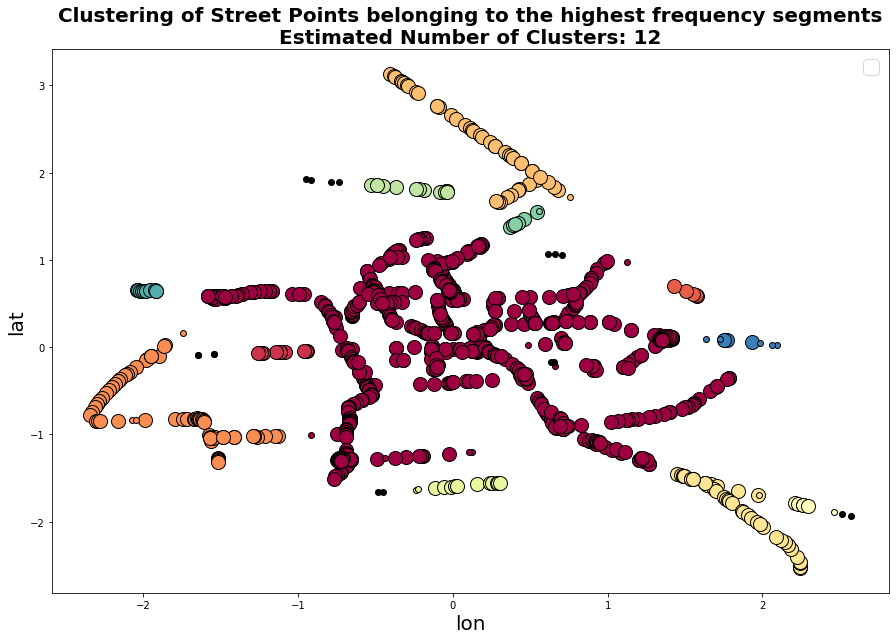

number of noise(s):  17


In [35]:
plt.figure(figsize=(15,10))
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black removed and only used for noises (noises would belong to cluster -1)
        col = [0, 0, 0, 1]
    class_member_mask = (labels == k)
    xy = Clus_dataSet[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col), markeredgecolor='k', markersize=14)
    xy = Clus_dataSet[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col), markeredgecolor='k', markersize=6)
plt.title('Clustering of Street Points belonging to the highest frequency segments\nEstimated Number of Clusters: %d' % realClusterNum, fontweight='bold',fontsize=20)
plt.xlabel('lon',fontsize=20)
plt.ylabel('lat',fontsize=20)
plt.legend(fontsize=20)
plt.show()
n_noise_ = list(labels).count(-1)
print('number of noise(s): ', n_noise_)

In [36]:
for clust_number in set(labels):
    clust_set = df[df.cluster == clust_number]
    if clust_number != -1:
        print ("Cluster "+str(clust_number)+', Count: '+ str(np.count_nonzero(clust_set.index)))

Cluster 0, Count: 688
Cluster 1, Count: 10
Cluster 2, Count: 5
Cluster 3, Count: 69
Cluster 4, Count: 47
Cluster 5, Count: 45
Cluster 6, Count: 6
Cluster 7, Count: 13
Cluster 8, Count: 13
Cluster 9, Count: 10
Cluster 10, Count: 10
Cluster 11, Count: 8


In [37]:
m = folium.Map(location=[46.066,11.133],zoom_start=14)

# busses
feat = folium.FeatureGroup("Busses", show=False)
for i in range(len(mm_bus)):
    folium.vector_layers.PolyLine(mm_bus.route[i], color='red').add_to(feat)
feat.add_to(m)

# frequent e-scooter routes
feat0 = folium.FeatureGroup('cluster 1')
feat1 = folium.FeatureGroup('cluster 2')
feat2 = folium.FeatureGroup('cluster 3')
feat3 = folium.FeatureGroup('cluster 4')
feat4 = folium.FeatureGroup('cluster 5')
feat5 = folium.FeatureGroup('cluster 6')
feat6 = folium.FeatureGroup('cluster 7')
feat7 = folium.FeatureGroup('cluster 8')
feat8 = folium.FeatureGroup('cluster 9')
feat9 = folium.FeatureGroup('cluster 10')
feat10 = folium.FeatureGroup('cluster 11')
feat11 = folium.FeatureGroup('cluster 12')
feat_noise = folium.FeatureGroup('noises')

def get_feat(cluster):
    if cluster == 0:
        return feat0, 'magenta'
    elif cluster == 1:
        return feat1, 'pink'
    elif cluster == 2:
        return feat2, 'green'
    elif cluster == 3:
        return feat3, 'purple'
    elif cluster == 4:
        return feat4, 'gold'
    elif cluster == 5:
        return feat5, 'orange'
    elif cluster == 6:
        return feat6, 'blue'
    elif cluster == 7:
        return feat7, 'lightblue'
    elif cluster == 8:
        return feat8, 'lightgreen'
    elif cluster == 9:
        return feat9, 'black'
    elif cluster == 10:
        return feat10, 'yellow'
    elif cluster == 11:
        return feat11, 'gray'
    else:
        return feat_noise, 'white'

for i in range(len(df)):
    clst, color = get_feat(df.at[i,'cluster'])
    folium.CircleMarker(location=[df.at[i, 'lat'], df.at[i, 'lon']],
                        radius=2, color=color,
                        weight=5).add_to(clst)

f = [feat0, feat1, feat2, feat3, feat4, feat5, feat6, feat7, feat8, feat9, feat10, feat11]

for ft in f:
    ft.add_to(m)


m.add_child(folium.LayerControl())
m

Frequent e-scooter trace in areas not already covered by busses are focussed on the city center and along the Adige river, areas where busses cannot enter.

### Repeat for stops
Aggregate e-scooter stops using DBSCAN clustering algorithm. The biggest clusters are the ones representing the areas of main stops of e-scooter trips: check if there is a correspondence between these clusters centroids and the bus stops.

In [38]:
bus_stops = feed.stops.copy(deep=True)
bus_stops

,stop_id,stop_code,stop_name,stop_desc,stop_lat,stop_lon,zone_id,wheelchair_boarding
0,1,28105z,Baselga Del Bondone,NaN,46.078325,11.047354,10110,2.0
1,2,28105x,Baselga Del Bondone,NaN,46.078582,11.047538,10110,1.0
2,3,27105c,Belvedere,NaN,46.044406,11.105338,10110,NaN
3,4,22220z,Lamar Ponte Avisio,NaN,46.134621,11.110910,10110,2.0
4,5,28060z,Sp 85 Bivio Sopramonte,NaN,46.085226,11.069310,10110,2.0
...,...,...,...,...,...,...,...,...
1098,3088,38576z,Pedersano S.Rocco,NaN,45.919578,11.019194,18511,2.0
1099,3089,38576x,Pedersano S.Rocco,NaN,45.919627,11.019096,18511,2.0
1100,3091,29030x,"Lavis Cantina ""La-Vis""",NaN,46.136991,11.109628,19025,2.0
1101,3092,21227x,"Cervara ""Scalinata""",NaN,46.072157,11.128197,10110,2.0


In [39]:
df = pd.read_parquet('../data/map_matched_routes.parquet')
start_pt=[]
end_pt=[]
start_lat=[]
start_lon=[]
end_lat=[]
end_lon=[]
for i in range(len(df.route)):
    start_pt.append(df.at[i, 'route'][0])
    start_lat.append(df.at[i, 'route'][0][0])
    start_lon.append(df.at[i, 'route'][0][-1])
    end_pt.append(df.at[i, 'route'][-1])
    end_lat.append(df.at[i, 'route'][-1][0])
    end_lon.append(df.at[i, 'route'][-1][-1])
df['start']=start_pt
df['end']=end_pt
df['end_lat']=end_lat
df['end_lon']=end_lon
df['start_lat']=start_lat
df['start_lon']=start_lon
df

,unique_id,route,matched,start,end,end_lat,end_lon,start_lat,start_lon
0,00000bf0-0000-1000-a6a0-5b7d6a617b60_2020-11-30,"[[46.069691, 11.121241], [46.069716, 11.121509...",True,"[46.069691, 11.121241]","[46.069804, 11.11585]",46.069804,11.115850,46.069691,11.121241
1,00001d90-0000-1000-8b30-5b7d6a617b60_2020-11-30,"[[46.07016, 11.120398], [46.070181, 11.12065],...",True,"[46.07016, 11.120398]","[46.068787, 11.115304]",46.068787,11.115304,46.070160,11.120398
2,0000210d-0000-1000-8d7d-5b7d6a617b60_2020-11-30,"[[46.067214, 11.126787], [46.067211, 11.126772...",True,"[46.067214, 11.126787]","[46.066807, 11.120438]",46.066807,11.120438,46.067214,11.126787
3,00000735-0000-1000-9635-5b7d6a617b60_2020-11-30,"[[46.069691, 11.12124], [46.069699, 11.121327]]",True,"[46.069691, 11.12124]","[46.069699, 11.121327]",46.069699,11.121327,46.069691,11.121240
4,00000e00-0000-1000-9ab0-5b7d6a617b60_2020-11-30,"[[46.069695, 11.121283], [46.069716, 11.121509...",True,"[46.069695, 11.121283]","[46.081532, 11.121218]",46.081532,11.121218,46.069695,11.121283
...,...,...,...,...,...,...,...,...,...
87918,00000c1f-0000-1000-a6bf-5b7d6a617b60_2022-03-04,"[[46.063361, 11.12368], [46.063356, 11.123623]...",True,"[46.063361, 11.12368]","[46.069792, 11.122202]",46.069792,11.122202,46.063361,11.123680
87919,830baf6d-455a-4f22-bdd4-9be7b521622d_2022-03-04,"[[46.075298, 11.123749], [46.075298, 11.123749]]",True,"[46.075298, 11.123749]","[46.075298, 11.123749]",46.075298,11.123749,46.075298,11.123749
87920,0daf00f7-4afb-43c6-8c7f-5e674945192d_2022-03-04,"[[46.075385, 11.123814], [46.075445, 11.123859...",True,"[46.075385, 11.123814]","[46.090307, 11.116202]",46.090307,11.116202,46.075385,11.123814
87921,00000d44-0000-1000-9a34-5b7d6a617b60_2022-03-04,"[[46.070977, 11.124824], [46.070926, 11.124821...",True,"[46.070977, 11.124824]","[46.058792, 11.118821]",46.058792,11.118821,46.070977,11.124824


In [40]:
Clus_dataSet = df[['end_lon','end_lat']]
# Clus_dataSet = df[['start_lon','start_lat']] # people have more control over the destination than the origin
Clus_dataSet = np.nan_to_num(Clus_dataSet)
Clus_dataSet = np.array(Clus_dataSet, dtype=np.float64)
Clus_dataSet = StandardScaler().fit_transform(Clus_dataSet)

In [41]:
# Compute DBSCAN
db = DBSCAN(eps=0.2, min_samples=5).fit(Clus_dataSet) # distance (eps) lower
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_
df['cluster']=labels
realClusterNum=len(set(labels)) - (1 if -1 in labels else 0)
clusterNum = len(set(labels))

In [42]:
print('number of clusters', set(labels))

number of clusters {0, 1, 2, 3, 4, 5, 6, 7, 8, -1}


In [43]:
for clust_number in set(labels):
    clust_set = df[df.cluster == clust_number]
    print ("Cluster "+str(clust_number)+', Count: '+ str(np.count_nonzero(clust_set.index)))

Cluster 0, Count: 86297
Cluster 1, Count: 12
Cluster 2, Count: 743
Cluster 3, Count: 389
Cluster 4, Count: 335
Cluster 5, Count: 26
Cluster 6, Count: 9
Cluster 7, Count: 13
Cluster 8, Count: 58
Cluster -1, Count: 40


In [44]:
# keep only most frequent e-scooter stops, namely the one belonging to the biggest clusters
# and compute their centroids

def compute_centroid(df):
    x = [df.at[p, 'end_lon'] for p in range(len(df.end_lon))]
    y = [df.at[p, 'end_lat'] for p in range(len(df.end_lat))]
    return (sum(x) / len(df), sum(y) / len(df))

# centroids
centroid0 = compute_centroid(df.loc[(df.cluster==0)].reset_index(drop=True))
centroid2 = compute_centroid(df.loc[(df.cluster==2)].reset_index(drop=True))
centroid3 = compute_centroid(df.loc[(df.cluster==3)].reset_index(drop=True))
centroid4 = compute_centroid(df.loc[(df.cluster==4)].reset_index(drop=True))

In [45]:
cntr_df = pd.DataFrame({'cluster': [0,2,3,4], 'centroids': [centroid0, centroid2, centroid3, centroid4]})
cntr_df

,cluster,centroids
0,0,"(11.121876743725425, 46.067467810933245)"
1,2,"(11.130764518169581, 46.03573482503367)"
2,3,"(11.102208210796917, 46.098487367609266)"
3,4,"(11.123499895522395, 46.040742170149265)"


In [46]:
m = folium.Map(location=[46.066,11.133],zoom_start=13)

# busses
feat = folium.FeatureGroup("Busses", show=False)
for i in range(len(bus_stops)):
    folium.CircleMarker(location=[bus_stops.at[i, 'stop_lat'], bus_stops.at[i, 'stop_lon']],
                        radius=2, weight=5, color = 'red').add_to(feat)
feat.add_to(m)

# frequent e-scooter stops
for i in range(len(cntr_df)):
    feat = folium.FeatureGroup("Centroid"+str(cntr_df.at[i, 'cluster']))
    t="Centroid "+str(cntr_df.at[i, 'cluster'])
    folium.CircleMarker(location=[cntr_df.at[i,'centroids'][1], cntr_df.at[i,'centroids'][0]],
                        radius=2, weight=5, popup=t).add_to(feat)
    feat.add_to(m)

m.add_child(folium.LayerControl())
m

### Try K-Means clustering algorithm and computing best number of clusters

In [203]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.preprocessing import StandardScaler

import matplotlib.pyplot as plt
import matplotlib.cm as cm

In [190]:
data_x = df[['end_lat','end_lon']]
x_array =  np.array(data_x)
scaler = MinMaxScaler()
x_scaled = scaler.fit_transform(x_array)
x_scaled

array([[0.40201188, 0.50814011],
       [0.39110525, 0.49736556],
       [0.36987109, 0.59867785],
       ...,
       [0.62189263, 0.51508633],
       [0.28391566, 0.56676862],
       [0.39379705, 0.68179576]])

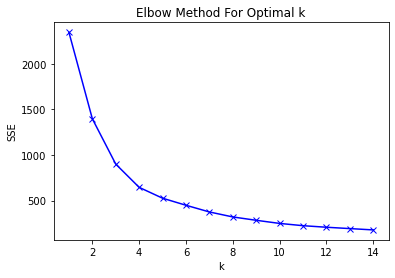

In [191]:
# elbow method
Sum_of_squared_distances =[]
K = range(1,15)
for k in K:
    km = KMeans(n_clusters =k)
    km = km.fit(x_scaled)
    Sum_of_squared_distances.append(km.inertia_)
    
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('SSE')
plt.title('Elbow Method For Optimal k')
plt.show()

For n_clusters = 2 The average silhouette_score is : 0.505878077727562
For n_clusters = 3 The average silhouette_score is : 0.4320773572943341
For n_clusters = 4 The average silhouette_score is : 0.39890240947561884


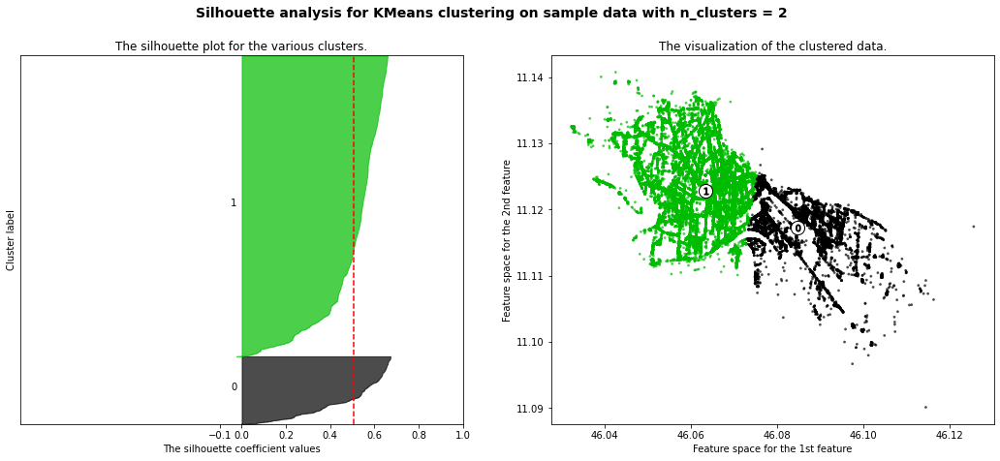

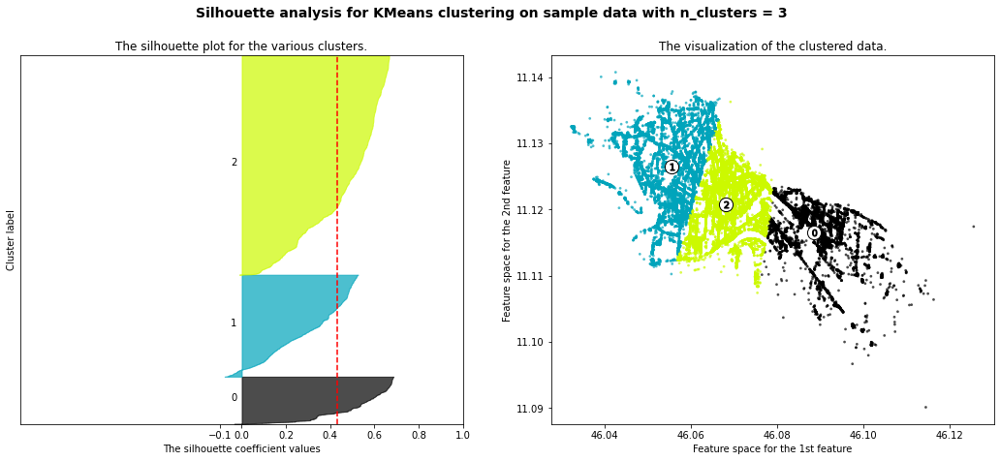

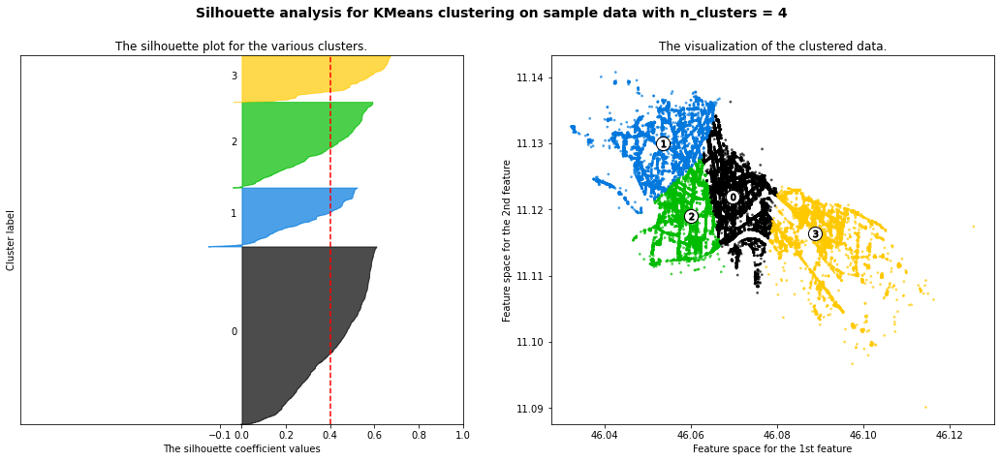

In [212]:
# silhouette method

range_n_clusters = [2, 3, 4] # taken from the elbow plot

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    ax1.set_xlim([-1, 1]) # silhouette coefficient can range from -1 to 1

    ax1.set_ylim([0, len(data_x) + (n_clusters + 1) * 10]) # add blank space

    # Initialize the clusterer with n_clusters value     
    clusterer = KMeans(n_clusters=n_clusters, random_state=10) 
    cluster_labels = clusterer.fit_predict(data_x)

    silhouette_avg = silhouette_score(data_x, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(data_x, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        data_x['end_lat'], data_x['end_lon'], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

The ideal number of clusters, according to the maximization of the silhouette score, is 2, which would not actually lead to any significative result in terms of new stops to introduce. Given the high density of points, the K-Means algorithm is probably not a good choice, and DBSCAN seems more appropriate.

In [213]:
km = KMeans(n_clusters=2)
y_predicted = km.fit_predict(df[['end_lat','end_lon']])
y_predicted

array([1, 1, 1, ..., 0, 1, 1])

In [214]:
df['cluster'] = y_predicted

In [216]:
len(df[df.cluster==0]), len(df[df.cluster==1])

(16152, 71771)

### New stops and stops frequencies
Let's check whether the most needed bus stops are connected and whether the frequency of the busses is enough as well or there is the need to increase the number of busses.
To do so, collect timestamps of start and end of e-scooters trips, and check the times of greatest passage of e-scooters belonging to the greatest clusters (highest frequency). Then compare these hours of highest need of transport with the times at which busses pass through the interested stops.

In [48]:
df = df.drop(['cluster'], axis=1).reset_index(drop=True)

0. Remove trips with travel distance less than 10 meters

In [49]:
df.head(1)

,unique_id,route,matched,start,end,end_lat,end_lon,start_lat,start_lon
0,00000bf0-0000-1000-a6a0-5b7d6a617b60_2020-11-30,"[[46.069691, 11.121241], [46.069716, 11.121509...",True,"[46.069691, 11.121241]","[46.069804, 11.11585]",46.069804,11.11585,46.069691,11.121241


In [50]:
# remove trips starting and ending in the same point (route len less than 2 points)
for i in range(len(df)):
    if len(df.at[i, 'route']) < 2:
        df = df.drop([i])

In [51]:
df = df.reset_index(drop=True)

In [52]:
# compute distances trips
from pyproj import Geod

geod = Geod(ellps="WGS84")
distance_mm = []
for i in range(len(df)):
    distance_mm.append(geod.geometry_length(LineString([[pt[1], pt[0]] for pt in df.at[i, 'route']])))
df['distance'] = distance_mm

# remove trips shorter than 10 meters
df = df[df.distance > 10].reset_index(drop=True)

1. Compute cluster assignment according to starting point and according to end point

In [53]:
def dbscan_clustering(df, list_columns, max_dist_dbscan, cluster_col_name):
    Clus_dataSet = df[list_columns]
    Clus_dataSet = np.nan_to_num(Clus_dataSet)
    Clus_dataSet = np.array(Clus_dataSet, dtype=np.float64)
    Clus_dataSet = StandardScaler().fit_transform(Clus_dataSet)

    # Compute DBSCAN
    db = DBSCAN(eps=max_dist_dbscan, min_samples=50).fit(Clus_dataSet) 
    core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
    core_samples_mask[db.core_sample_indices_] = True
    labels = db.labels_
    df[cluster_col_name]=labels

    # for clust_number in set(labels):
    #     clust_set = df[df[cluster_col_name] == clust_number]
    #     print ("Cluster "+str(clust_number)+', Count: '+ str(np.count_nonzero(clust_set.index)))
    
    return df

In [54]:
# build a temporary dataframe with starting and ending points of each trips (one point per row) and perform dbscan on all of them

temp_df = df[['end_lat', 'end_lon']].reset_index()
temp_df = temp_df.rename(columns={'end_lat':'lat', 'end_lon':'lon'})
temp_df['pt'] = 'end'

temp_df_start = df[['start_lat', 'start_lon']].reset_index()
temp_df_start = temp_df_start.rename(columns={'start_lat':'lat', 'start_lon':'lon'})
temp_df_start['pt'] = 'start'

temp_df = temp_df.append(temp_df_start)

temp_df = dbscan_clustering(temp_df, ['lat', 'lon'], 0.01, 'cluster')

temp_df

,index,lat,lon,pt,cluster
0,0,46.069804,11.115850,end,0
1,1,46.068787,11.115304,end,-1
2,2,46.066807,11.120438,end,8
3,3,46.081532,11.121218,end,1
4,4,46.071698,11.124512,end,-1
...,...,...,...,...,...
79487,79487,46.061244,11.115899,start,78
79488,79488,46.063361,11.123680,start,35
79489,79489,46.075385,11.123814,start,64
79490,79490,46.070977,11.124824,start,91


In [55]:
len(temp_df.cluster.unique())

362

In [56]:
# compute centroids 
def compute_centroid(df, lon_col, lat_col):
    x = [df.at[p, lon_col] for p in range(len(df[lon_col]))]
    y = [df.at[p, lat_col] for p in range(len(df[lat_col]))]
    return (sum(x) / len(df), sum(y) / len(df))
    
cluster = []
centroids = []
for clst in temp_df.cluster.unique():
    cluster.append(clst)
    centroids.append(compute_centroid(temp_df.loc[(temp_df.cluster==clst)].reset_index(drop=True), 'lon', 'lat'))

cluster_df = pd.DataFrame({'cluster':cluster, 'centroid':centroids})

In [57]:
# get clusters assignments and add them to the original dataframe
end_clusters = temp_df[temp_df.pt == 'end'].cluster.to_list()
start_clusters = temp_df[temp_df.pt == 'start'].cluster.to_list()
df['end_cluster'] = end_clusters
df['start_cluster'] = start_clusters

In [58]:
# drop trips that start and end within the same cluster
df = df[df.start_cluster != df.end_cluster].reset_index(drop=True)
# drop noises
df = df.loc[(df.end_cluster != -1) & (df.start_cluster != -1)].reset_index(drop=True)
len(df)

34665

In [59]:
m = folium.Map(location=[46.066,11.133],zoom_start=13)

prova = df[df.end_cluster==0].reset_index()

for i in range(len(prova)):
    folium.CircleMarker(location=[prova.at[i,'end_lat'], prova.at[i,'end_lon']],
                            radius=2, weight=8, color='magenta').add_to(m)

m.add_child(folium.LayerControl())
m

2. Collect start and stop times and create timewindows of 30 minutes to associate to each e-scooter trip

In [60]:
# collect timestamps

# read map-matched df & original one
orig_df= pd.read_parquet('C:/Users/luisa/Desktop/escooter_trento/data/trips_pointv3_cleaned.parquet')
new_df = orig_df.groupby('unique_id', as_index=False).aggregate({"point_timestamp":lambda x: x.to_list()})

# collect start/end time trips
start_time = {}
end_time = {}
for i in range(len(new_df)):
    start_time[new_df.at[i, 'unique_id']] = min(new_df.at[i, 'point_timestamp'])
    end_time[new_df.at[i, 'unique_id']] = max(new_df.at[i, 'point_timestamp'])

# add start and end time of each trip to map-matched df
tmstmp_start = []
tmstmp_end = []
for row in range(len(df)):
    tmstmp_start.append(start_time[df.at[row, 'unique_id']])
    tmstmp_end.append(end_time[df.at[row, 'unique_id']])
df['start_time'] = tmstmp_start
df['end_time'] = tmstmp_end

# add column with hour
df['start_hour'] = [df.at[i, 'start_time'].hour for i in range(len(df))]

In [61]:
# add column with minutes
df['start_minutes'] = [df.at[i, 'start_time'].minute for i in range(len(df))]
# round minutes according to intervals of 30 minutes 
for i in range(len(df)):
    if df.at[i, 'start_minutes'] < 30:
        df.at[i, 'start_minutes'] = '0-30'
    else:
        df.at[i, 'start_minutes'] = '30-59'

In [62]:
df['timewindow'] = [''] *len(df)
for i in range(len(df)):
    df.at[i, 'timewindow'] = str(df.at[i, 'start_hour']) + ' h '+ df.at[i, 'start_minutes'] + ' mins'

3. Group trips according to the timewindow around the starting time, the cluster of origin, and the cluster of destination, so that it is possible to count how many trips starting from a given cluster at a given time arrive to the destination cluster, and then to check whether there is a bus covering the routes with highest counts at the mentioned time.

In [63]:
start_cnt = df[['start_cluster', 'end_cluster', 'timewindow', 'unique_id']].groupby(['timewindow', 'start_cluster', 'end_cluster']).aggregate(['count']).reset_index()
start_cnt.columns = start_cnt.columns.droplevel(1)
start_cnt = start_cnt.rename(columns={'unique_id':'count_of_trips'})
start_cnt = start_cnt.sort_values(by=['count_of_trips'], ascending=False).reset_index(drop=True)
start_cnt

,timewindow,start_cluster,end_cluster,count_of_trips
0,15 h 0-30 mins,17,9,81
1,19 h 30-59 mins,111,39,68
2,15 h 30-59 mins,39,111,49
3,16 h 0-30 mins,17,9,48
4,13 h 0-30 mins,111,39,47
...,...,...,...,...
26920,15 h 0-30 mins,6,20,1
26921,15 h 0-30 mins,6,9,1
26922,15 h 0-30 mins,6,4,1
26923,15 h 0-30 mins,6,1,1


In [64]:
q = start_cnt.quantile([0.97, 0.98, 0.985, 0.99, 1])
q

,start_cluster,end_cluster,count_of_trips
0.970,314.0,322.0,3.0
0.980,324.0,333.0,4.0
0.985,331.0,339.0,4.0
0.990,339.0,346.0,5.0
1.000,360.0,360.0,81.0


In [65]:
# keep only most frequent routes (from starting cluster to ending cluster, with highest count of trips)
start_cnt = start_cnt.loc[start_cnt.count_of_trips > q.at[0.99, 'count_of_trips']].sort_values(by=['timewindow']).reset_index(drop=True)
start_cnt

,timewindow,start_cluster,end_cluster,count_of_trips
0,10 h 0-30 mins,40,79,7
1,10 h 0-30 mins,176,106,10
2,10 h 0-30 mins,48,92,8
3,10 h 0-30 mins,11,106,6
4,10 h 0-30 mins,57,106,6
...,...,...,...,...
234,9 h 30-59 mins,4,58,7
235,9 h 30-59 mins,39,111,7
236,9 h 30-59 mins,11,106,13
237,9 h 30-59 mins,10,111,20


In [66]:
popular_trips = start_cnt.groupby(['start_cluster','end_cluster']).size().reset_index().rename(columns={0:'combination_repeated'}).sort_values(by=['combination_repeated'], ascending=False).reset_index(drop=True)
popular_trips

,start_cluster,end_cluster,combination_repeated
0,83,18,7
1,111,39,7
2,18,20,6
3,216,10,6
4,8,20,5
...,...,...,...
139,31,139,1
140,31,113,1
141,31,99,1
142,31,20,1


In [67]:
popular_trips['timewindows'] = None
popular_trips['cumulative_num_trips'] = None

for i in range(len(popular_trips)):
    c = 0
    times = []
    for indx in np.where((start_cnt.start_cluster==popular_trips.at[i, 'start_cluster']) & (start_cnt.end_cluster==popular_trips.at[i, 'end_cluster']))[0]:
        times.append(start_cnt.at[indx, 'timewindow'])
        c += start_cnt.at[indx, 'count_of_trips']
    
    popular_trips.at[i, 'cumulative_num_trips'] = c
    popular_trips.at[i, 'timewindows'] = times

In [68]:
# get cluster centroids from cluster_df
centroid_start = []
centroid_end = []
for i in range(len(popular_trips)):
    centroid_start.append(cluster_df.at[np.where(cluster_df.cluster==popular_trips.at[i, 'start_cluster'])[0][0], 'centroid'])
    centroid_end.append(cluster_df.at[np.where(cluster_df.cluster==popular_trips.at[i, 'end_cluster'])[0][0], 'centroid'])
popular_trips['centroid_start'] = centroid_start
popular_trips['centroid_end'] = centroid_end

In [69]:
popular_trips

,start_cluster,end_cluster,combination_repeated,timewindows,cumulative_num_trips,centroid_start,centroid_end
0,83,18,7,"[10 h 30-59 mins, 11 h 0-30 mins, 12 h 0-30 mi...",52,"(11.115868768547928, 46.060595764109)","(11.11900770309122, 46.06680177713895)"
1,111,39,7,"[12 h 30-59 mins, 13 h 0-30 mins, 13 h 30-59 m...",208,"(11.130402108299604, 46.036391470647835)","(11.125931331471195, 46.068940163873265)"
2,18,20,6,"[10 h 0-30 mins, 12 h 0-30 mins, 16 h 0-30 min...",38,"(11.11900770309122, 46.06680177713895)","(11.115815550254046, 46.060364688305384)"
3,216,10,6,"[13 h 0-30 mins, 13 h 30-59 mins, 14 h 0-30 mi...",63,"(11.118117526737972, 46.054200941176475)","(11.124466289323035, 46.06923547120213)"
4,8,20,5,"[12 h 0-30 mins, 12 h 30-59 mins, 15 h 0-30 mi...",33,"(11.119986558792366, 46.06677993220347)","(11.115815550254046, 46.060364688305384)"
...,...,...,...,...,...,...,...
139,31,139,1,[7 h 0-30 mins],9,"(11.121002745754238, 46.07354452347642)","(11.127339653333362, 46.06915416444438)"
140,31,113,1,[5 h 30-59 mins],6,"(11.121002745754238, 46.07354452347642)","(11.12239504438283, 46.08202330097073)"
141,31,99,1,[6 h 30-59 mins],6,"(11.121002745754238, 46.07354452347642)","(11.1271024096154, 46.069044244230625)"
142,31,20,1,[12 h 30-59 mins],7,"(11.121002745754238, 46.07354452347642)","(11.115815550254046, 46.060364688305384)"


In [70]:
m = folium.Map(location=[46.066,11.133],zoom_start=13)

# busses
feat = folium.FeatureGroup("Busses", show=False)
for i in range(len(bus_stops)):
    folium.CircleMarker(location=[bus_stops.at[i, 'stop_lat'], bus_stops.at[i, 'stop_lon']],
                        radius=2, weight=5, color = 'green').add_to(feat)
feat.add_to(m)


# centroids of most frequents starting and ending clusters 
feat_start = folium.FeatureGroup("Starting Points", show=False)
feat_stop = folium.FeatureGroup("Stops", show=True)

for i in range(len(popular_trips)):
    folium.CircleMarker(location=[popular_trips.at[i,'centroid_start'][1], popular_trips.at[i,'centroid_start'][0]],
                            radius=2, weight=8, color='blue').add_to(feat_start)
    folium.CircleMarker(location=[popular_trips.at[i,'centroid_end'][1], popular_trips.at[i,'centroid_end'][0]],
                            radius=2, weight=8, color='red').add_to(feat_stop)

m.add_child(feat_start)
m.add_child(feat_stop)
m.add_child(folium.LayerControl())
m

4. For each centroid of origin and destination, find the closest bus stop and check if there is a bus line connecting the points and at which time. If there is not, the two points are not directly linked by a bus route, that may be added. If there is a route, then check whether it exists also at the most needed times, present in the timewindow column.

In [71]:
import pyproj as proj
from scipy.spatial import KDTree

# setup start and end projection
crs_lonlat = proj.Proj(init='epsg:4326') # start projection
crs_meters = proj.Proj(init='epsg:32632') # meters 32632 italia utm 32n wgs84

popular_trips['start_meters'] = None
popular_trips['end_meters'] = None
for i in range(len(popular_trips)):
    popular_trips.at[i, 'start_meters'] = proj.transform(crs_lonlat, crs_meters, popular_trips.at[i, 'centroid_start'][0], popular_trips.at[i, 'centroid_start'][1])
    popular_trips.at[i, 'end_meters'] = proj.transform(crs_lonlat, crs_meters, popular_trips.at[i, 'centroid_end'][0], popular_trips.at[i, 'centroid_end'][1])

In [72]:
bus_stops['pt_meters'] = None
for i in range(len(bus_stops)):
    bus_stops.at[i, 'pt_meters'] = proj.transform(crs_lonlat, crs_meters, bus_stops.at[i, 'stop_lon'], bus_stops.at[i, 'stop_lat'])
    
bus_stops

,stop_id,stop_code,stop_name,stop_desc,stop_lat,stop_lon,zone_id,wheelchair_boarding,pt_meters
0,1,28105z,Baselga Del Bondone,NaN,46.078325,11.047354,10110,2.0,"(658306.2968045992, 5104787.678259917)"
1,2,28105x,Baselga Del Bondone,NaN,46.078582,11.047538,10110,1.0,"(658319.788589234, 5104816.598804329)"
2,3,27105c,Belvedere,NaN,46.044406,11.105338,10110,NaN,"(662889.4454690034, 5101136.174845794)"
3,4,22220z,Lamar Ponte Avisio,NaN,46.134621,11.110910,10110,2.0,"(663054.3793156637, 5111171.010933497)"
4,5,28060z,Sp 85 Bivio Sopramonte,NaN,46.085226,11.069310,10110,2.0,"(659984.0043472403, 5105598.367408516)"
...,...,...,...,...,...,...,...,...,...
1098,3088,38576z,Pedersano S.Rocco,NaN,45.919578,11.019194,18511,2.0,"(656576.2322632642, 5087094.489917658)"
1099,3089,38576x,Pedersano S.Rocco,NaN,45.919627,11.019096,18511,2.0,"(656568.4951816474, 5087099.741513418)"
1100,3091,29030x,"Lavis Cantina ""La-Vis""",NaN,46.136991,11.109628,19025,2.0,"(662948.3611869176, 5111431.702901614)"
1101,3092,21227x,"Cervara ""Scalinata""",NaN,46.072157,11.128197,10110,2.0,"(664575.5099002899, 5104266.514404652)"


In [73]:
popular_trips.head(1)

,start_cluster,end_cluster,combination_repeated,timewindows,cumulative_num_trips,centroid_start,centroid_end,start_meters,end_meters
0,83,18,7,"[10 h 30-59 mins, 11 h 0-30 mins, 12 h 0-30 mi...",52,"(11.115868768547928, 46.060595764109)","(11.11900770309122, 46.06680177713895)","(663656.347910866, 5102956.557160571)","(663880.7594761795, 5103652.5422839075)"


In [74]:
# array of bus stops points
stops = []
for p in bus_stops.pt_meters.to_list():
    stops.append(p)
stops = np.array(stops)

# array of points of destination
destination = []
for pt in popular_trips.end_meters:
    destination.append((pt[0], pt[1]))
destination = np.array(destination)

# array of points of origin
origin = []
for pt in popular_trips.start_meters:
    origin.append((pt[0], pt[1]))
origin = np.array(origin)

In [75]:
# fit on bus stops points
tree = KDTree(stops)

In [76]:
# finds the nearest bus stop; returns arrays of distances from the nearest neighbour and array of indexes of the nearest neighbour
distance_of_nn, index_of_nn = tree.query(origin, 1) 

popular_trips['dist_stop_origin'] = distance_of_nn

bus_lat = []
bus_lon = []
stop_id = []
for i in range(len(index_of_nn)):
    stop_id.append(bus_stops.at[index_of_nn[i], 'stop_id'])
    bus_lat.append(bus_stops.at[index_of_nn[i], 'stop_lat'])
    bus_lon.append(bus_stops.at[index_of_nn[i], 'stop_lon'])

popular_trips['stop_id_origin'] = stop_id
popular_trips['bus_lat_origin'] = bus_lat
popular_trips['bus_lon_origin'] = bus_lon

In [77]:
# repeat for destination
distance_of_nn, index_of_nn = tree.query(destination, 1) 

popular_trips['dist_stop_destination'] = distance_of_nn

bus_lat = []
bus_lon = []
stop_id = []
for i in range(len(index_of_nn)):
    stop_id.append(bus_stops.at[index_of_nn[i], 'stop_id'])
    bus_lat.append(bus_stops.at[index_of_nn[i], 'stop_lat'])
    bus_lon.append(bus_stops.at[index_of_nn[i], 'stop_lon'])

popular_trips['stop_id_destination'] = stop_id
popular_trips['bus_lat_destination'] = bus_lat
popular_trips['bus_lon_destination'] = bus_lon

In [78]:
popular_trips.dist_stop_destination.max() 

261.3449358807792

In [79]:
popular_trips.head(1)

,start_cluster,end_cluster,combination_repeated,timewindows,cumulative_num_trips,centroid_start,centroid_end,start_meters,end_meters,dist_stop_origin,stop_id_origin,bus_lat_origin,bus_lon_origin,dist_stop_destination,stop_id_destination,bus_lat_destination,bus_lon_destination
0,83,18,7,"[10 h 30-59 mins, 11 h 0-30 mins, 12 h 0-30 mi...",52,"(11.115868768547928, 46.060595764109)","(11.11900770309122, 46.06680177713895)","(663656.347910866, 5102956.557160571)","(663880.7594761795, 5103652.5422839075)",236.319555,348,46.060365,11.118905,102.701333,2520,46.066496,11.117755


In [80]:
stop_times = feed.stop_times.copy(deep=True)
stop_times

,trip_id,arrival_time,departure_time,stop_id,stop_sequence
0,0003644452021091320220610,06:34:00,06:34:00,3049,1
1,0003644452021091320220610,06:34:00,06:34:00,3050,2
2,0003644452021091320220610,06:35:00,06:35:00,3052,3
3,0003644452021091320220610,06:36:00,06:36:00,3054,4
4,0003644452021091320220610,06:37:00,06:37:00,3047,5
...,...,...,...,...,...
75285,0003718602022031420220610,06:27:00,06:27:00,2501,18
75286,0003718602022031420220610,06:27:00,06:27:00,234,19
75287,0003718602022031420220610,06:27:00,06:27:00,113,20
75288,0003718602022031420220610,06:28:00,06:28:00,237,21


In [81]:
popular_trips['bus_line'] = None

for i in range(len(popular_trips)):
    popular_trips.at[i, 'bus_line'] = []
    temp_df = stop_times.loc[(stop_times.stop_id == popular_trips.at[i, 'stop_id_destination']) | (stop_times.stop_id == popular_trips.at[i, 'stop_id_origin'])].reset_index(drop=True)
    for t in temp_df.trip_id.unique():
        tdf = temp_df[temp_df.trip_id==t].reset_index(drop=True)
        # check if bus passes both near origin and destination of e-scooter trip
        if len(tdf)>1 and len(tdf.stop_id.unique())>1:
            if tdf.at[np.where(tdf.stop_id == popular_trips.at[i, 'stop_id_destination'])[0][0], 'stop_sequence'] > tdf.at[np.where(tdf.stop_id == popular_trips.at[i, 'stop_id_origin'])[0][0], 'stop_sequence']:
                # check if there is bus at the needed time
                for time in popular_trips.at[i, 'timewindows']:
                    if tdf.at[np.where(tdf.stop_id == popular_trips.at[i, 'stop_id_origin'])[0][0], 'departure_time'][:2] == time[:2] and tdf.at[np.where(tdf.stop_id == popular_trips.at[i, 'stop_id_origin'])[0][0], 'departure_time'][3:5] <= time.split(' ')[2].split('-')[1] and tdf.at[np.where(tdf.stop_id == popular_trips.at[i, 'stop_id_origin'])[0][0], 'departure_time'][3:5] >= time.split(' ')[2].split('-')[0]:
                        popular_trips.at[i, 'bus_line'].append([t, time])
                        popular_trips.at[i, 'timewindows'].remove(time)

In [82]:
# if no bus stops is found, try to check if there are bus starting from the second and third nearest stop from the origin;
# the reason is that e-scooters riders have little control over the starting point of trips, thus this point may be a little bit more flexible
distance_of_nn, index_of_nn = tree.query(origin, 3) 

def nth_nearest_neighbour(nn):
    bus_lat = []
    bus_lon = []
    stop_id = []
    for i in range(len(index_of_nn)):
        stop_id.append(bus_stops.at[index_of_nn[i][nn], 'stop_id'])
        bus_lat.append(bus_stops.at[index_of_nn[i][nn], 'stop_lat'])
        bus_lon.append(bus_stops.at[index_of_nn[i][nn], 'stop_lon'])

    popular_trips['stop_id_origin2'] = stop_id
    popular_trips['bus_lat_origin2'] = bus_lat
    popular_trips['bus_lon_origin2'] = bus_lon


    for i in range(len(popular_trips)):
        if len(popular_trips.at[i, 'bus_line']) == 0 or len(popular_trips.at[i, 'timewindows']) > 0: 
            temp_df = stop_times.loc[(stop_times.stop_id == popular_trips.at[i, 'stop_id_destination']) | (stop_times.stop_id == popular_trips.at[i, 'stop_id_origin2'])].reset_index(drop=True)
            for t in temp_df.trip_id.unique():
                tdf = temp_df[temp_df.trip_id==t].reset_index(drop=True)
                # check if bus passes both near origin and destination of e-scooter trip
                if len(tdf)>1 and len(tdf.stop_id.unique())>1:
                    if tdf.at[np.where(tdf.stop_id == popular_trips.at[i, 'stop_id_destination'])[0][0], 'stop_sequence'] > tdf.at[np.where(tdf.stop_id == popular_trips.at[i, 'stop_id_origin2'])[0][0], 'stop_sequence']:
                        # check if there is bus at the needed time
                        for time in popular_trips.at[i, 'timewindows']:
                            if tdf.at[np.where(tdf.stop_id == popular_trips.at[i, 'stop_id_origin2'])[0][0], 'departure_time'][:2] == time[:2] and tdf.at[np.where(tdf.stop_id == popular_trips.at[i, 'stop_id_origin2'])[0][0], 'departure_time'][3:5] <= time.split(' ')[2].split('-')[1] and tdf.at[np.where(tdf.stop_id == popular_trips.at[i, 'stop_id_origin2'])[0][0], 'departure_time'][3:5] >= time.split(' ')[2].split('-')[0]:
                                popular_trips.at[i, 'bus_line'].append([t, time])
                                popular_trips.at[i, 'timewindows'].remove(time)

nth_nearest_neighbour(1)
nth_nearest_neighbour(2)

In [83]:
print(len(popular_trips[popular_trips['bus_line'].map(lambda d: len(d)) > 0]), 'trips on', len(popular_trips), 'have bus alternatives at the desired time, of which',len(popular_trips.loc[(popular_trips['timewindows'].map(lambda d: len(d)) > 0)&(popular_trips['bus_line'].map(lambda d: len(d)) > 0)] ), 'are covered only in certain timewindows.')

34 trips on 144 have bus alternatives at the desired time, of which 9 are covered only in certain timewindows.


In [84]:
not_linked_pts = popular_trips[popular_trips['bus_line'].map(lambda d: len(d)) == 0].reset_index(drop=True)

In [85]:
for i in range(len(not_linked_pts)):
    print( not_linked_pts.at[i, 'stop_id_destination'], not_linked_pts.at[i, 'stop_id_origin'], not_linked_pts.at[i, 'timewindows'] )

2927 93 ['12 h 30-59 mins', '13 h 0-30 mins', '13 h 30-59 mins', '14 h 0-30 mins', '19 h 30-59 mins', '20 h 0-30 mins', '20 h 30-59 mins']
443 395 ['13 h 0-30 mins', '13 h 30-59 mins', '14 h 0-30 mins', '14 h 30-59 mins', '5 h 0-30 mins', '6 h 0-30 mins']
217 305 ['18 h 0-30 mins', '19 h 0-30 mins', '19 h 30-59 mins', '20 h 0-30 mins', '20 h 30-59 mins']
247 410 ['14 h 0-30 mins', '15 h 0-30 mins', '16 h 0-30 mins', '16 h 30-59 mins', '17 h 0-30 mins']
295 466 ['11 h 0-30 mins', '12 h 0-30 mins', '5 h 0-30 mins', '6 h 0-30 mins']
410 247 ['5 h 30-59 mins', '6 h 0-30 mins', '6 h 30-59 mins', '7 h 0-30 mins']
443 2520 ['6 h 0-30 mins', '7 h 0-30 mins', '7 h 30-59 mins']
395 443 ['10 h 30-59 mins', '11 h 30-59 mins', '12 h 30-59 mins']
89 93 ['19 h 30-59 mins', '20 h 30-59 mins']
410 348 ['16 h 0-30 mins', '16 h 30-59 mins']
2939 410 ['11 h 30-59 mins', '18 h 0-30 mins']
2957 348 ['6 h 0-30 mins', '6 h 30-59 mins']
355 421 ['5 h 30-59 mins', '7 h 30-59 mins']
165 2432 ['7 h 0-30 mins', '8

There are two possibilities to cover these stops at the needed time: one may either add or expand existing bus stops routes in order to link also the nearest stops to the origin and destination of trips, or one may add new stops corresponding to the centroids, and integrate them in the bus system. 
Thus, the following part aims to find routes between unconnected bus stops (that may be added expecially at the corresponding time in the dataset above) and to collect possible new bus stops. 
Firstly, one shall remove trips starting or ending in the city center. Then, one may group by time stops not linked and centroids, and try to find the optimal route linking points associated to the same timewindow, to build a unique route to cover at the same hour of the day.

In [92]:
import pyproj
from shapely.ops import transform
import alphashape
from shapely.geometry import Point

In [160]:
# travel saleperson requirements
import six
import sys
sys.modules['sklearn.externals.six'] = six
import mlrose

In [133]:
area = gpd.read_file("../data/static/ZTL-P.shp") 

points = []
for idx, row in area.iterrows():
  points= points + (list(area.geometry[idx].exterior.coords))
points = np.array(points)

alpha_shape = alphashape.alphashape(points, 0.01)

project = pyproj.Transformer.from_proj(
    pyproj.Proj(init='epsg:25832'), # source
    pyproj.Proj(init='epsg:4326')) # destination

# apply projection 
g2 = transform(project.transform, alpha_shape)  

# check if points are inside the city center
not_linked_pts["start_is_within"] = not_linked_pts.apply(lambda row: g2.buffer(0.0001).intersects(Point(row["centroid_start"][0], row["centroid_start"][1])), axis = 1)
not_linked_pts["end_is_within"] = not_linked_pts.apply(lambda row: g2.buffer(0.0001).intersects(Point(row["centroid_end"][0], row["centroid_end"][1])), axis = 1)

In [134]:
not_linked_pts = not_linked_pts.loc[(not_linked_pts.start_is_within==False) & (not_linked_pts.end_is_within==False)].reset_index(drop=True)

In [135]:
m = folium.Map(location=[46.066,11.133],zoom_start=13)

folium.GeoJson(g2.buffer(0.0001)).add_to(m)

for i in range(len(not_linked_pts)):
    folium.CircleMarker(location=[not_linked_pts.at[i,'centroid_start'][1], not_linked_pts.at[i,'centroid_start'][0]],
                            radius=2, weight=8, color='blue').add_to(m)
    folium.CircleMarker(location=[not_linked_pts.at[i,'centroid_end'][1], not_linked_pts.at[i,'centroid_end'][0]],
                            radius=2, weight=8, color='red').add_to(m)

m.add_child(folium.LayerControl())
m

In [224]:
d_new_route={}
d_new_stops={}
for i in range(len(not_linked_pts)):
    for t in not_linked_pts.at[i, 'timewindows']:
        if t not in d_new_route.keys():
            d_new_route[t] = []
        if t not in d_new_stops.keys():
            d_new_stops[t] = []
        d_new_route[t].append((not_linked_pts.at[i, 'bus_lat_destination'], not_linked_pts.at[i, 'bus_lon_destination']))
        d_new_stops[t].extend([(not_linked_pts.at[i, 'centroid_start'][1], not_linked_pts.at[i, 'centroid_start'][0]), (not_linked_pts.at[i, 'centroid_end'][1], not_linked_pts.at[i, 'centroid_end'][0])])

In [225]:
# remove duplicated points within same trajectory
def remove_dupl(d):
    res={}
    for k in d.keys():
        d[k] = list(set(d[k]))
        if len(d[k])>2:
            res[k] = d[k]
    return res

d_new_route = remove_dupl(d_new_route)
d_new_stops = remove_dupl(d_new_stops)

In [226]:
def optimal_stops_order(d_new_stops: dict):
    for k in d_new_stops.keys():
        coords_list = d_new_stops[k]
        # Initialize fitness function object using coords_list
        fitness_coords = mlrose.TravellingSales(coords = coords_list)
        # Define optimization problem object
        problem_fit = mlrose.TSPOpt(length = len(coords_list), fitness_fn = fitness_coords, maximize=False)
        # Solve problem using the genetic algorithm
        best_state, best_fitness = mlrose.genetic_alg(problem_fit, random_state = 2)
        # sort coordinates of stops according to the optimal order for the route
        sorting_lst = []
        for i in best_state:
            sorting_lst.append(coords_list[i])
        d_new_stops[k] = sorting_lst
    
    return d_new_stops

d_new_stops = optimal_stops_order(d_new_stops)
d_new_route = optimal_stops_order(d_new_route)

In [234]:
m = folium.Map(location=[46.066,11.133],zoom_start=13)

# current busses
feat = folium.FeatureGroup("Busses", show=False)
for i in range(len(mm_bus)):
    folium.vector_layers.PolyLine(mm_bus.route[i], color='red').add_to(feat)
feat.add_to(m)

# new bus stops routes
for k in d_new_stops.keys():
    feat = folium.FeatureGroup("New Bus Stops, @"+str(k), show=False)
    for i in range(len(d_new_stops[k])):
        folium.CircleMarker(location=d_new_stops[k][i],
                            radius=2, color='blue',
                            weight=5, tooltip=i+1).add_to(feat)
    feat.add_to(m)

# new route on existing bus stops
for k in d_new_route.keys():
    feat = folium.FeatureGroup("New Routes, @"+str(k), show=False)
    for i in range(len(d_new_route[k])):
        folium.CircleMarker(location=d_new_route[k][i],
                            radius=2, color='green',
                            weight=5, tooltip=i+1).add_to(feat)
    feat.add_to(m)

m.add_child(folium.LayerControl())
m